In [1]:
# -*- coding: utf-8 -*-
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import time
from matplotlib.ticker import MultipleLocator 

%matplotlib inline

In [2]:
path = os.getcwd().split('TianChi_IJCAI-17_footfall_prediction_code')[0]

#shop_info = pd.read_table(path+'dataset/shop_info.txt',names=['shop_id','city_name','location_id','per_pay','score','comment_cnt','shop_level','cate_1_name','cate_2_name','cate_3_name'],header=None,delimiter=',',encoding='utf8',delim_whitespace=False,index_col=False)
shop_info = pd.read_table(path+'dataset/shop info with count.csv',delimiter=',',encoding='utf8',delim_whitespace=False,index_col=False)

shop_info.index = shop_info['shop_id'].tolist()

## 基本的计算

In [9]:
def dateRange(start, end):
    days = (datetime.datetime.strptime(end, "%Y-%m-%d") - datetime.datetime.strptime(start, "%Y-%m-%d")).days + 1
    return [datetime.datetime.strftime(datetime.datetime.strptime(start, "%Y-%m-%d") + datetime.timedelta(i), "%Y-%m-%d") for i in xrange(days)]
#len(dateRange('2015-07-01','2016-10-31'))

In [434]:
def date_to_week(date):
    if type(date) == str:
        date = pd.to_datetime(date).date()
    #type(date) == datetime.date
    return (date - datetime.date(2015,7,7)).days  / 7

# 2015-07-07 2015-07-13   

In [442]:
def week_to_date(week_number,return_str=True):
    if week_to_date:
        return [(datetime.date(2015,7,7)+ datetime.timedelta(week_number*7)).strftime("%Y-%m-%d"),(datetime.date(2015,7,13)+ datetime.timedelta(week_number*7)).strftime("%Y-%m-%d")]
    return [datetime.date(2015,7,7)+ datetime.timedelta(week_number*7),datetime.date(2015,7,13)+ datetime.timedelta(week_number*7)]


## 数据预处理

#### 填充 2015.12.12

In [575]:
def fillna_double_12(x):
    if pd.to_datetime(x['start_day']).date() < pd.to_datetime('2015-12-12').date():  
        if x['2015-12-05']>0 and x['2015-12-19']>0 :
            return int(x['2015-12-05'] + x['2015-12-19'] /2.0 +0.5)
        elif x['2015-12-05']>0: return x['2015-12-05']
        elif x['2015-12-19']>0: return x['2015-12-19']
        else: return 0
    return 0
shop_info['2015-12-12'] = shop_info.apply(lambda x:fillna_double_12(x),axis=1)

In [576]:
shop_info['2015-12-12']

1       317
2        76
3         0
4         0
5        29
6         0
7       183
8         0
9       206
10        0
11       87
12        0
13        0
14       86
15        0
16       64
17      105
18        0
19      211
20        0
21        0
22       77
23       79
24        0
25      109
26       58
27       77
28       66
29       40
30        0
       ... 
1971     28
1972    123
1973     32
1974     15
1975    315
1976    185
1977    151
1978      0
1979      0
1980     80
1981      0
1982      0
1983      0
1984      0
1985    396
1986    148
1987    103
1988    280
1989     36
1990    162
1991     58
1992      0
1993      0
1994     97
1995      0
1996      0
1997     24
1998     49
1999    227
2000      0
Name: 2015-12-12, dtype: int64

In [ ]:
## 

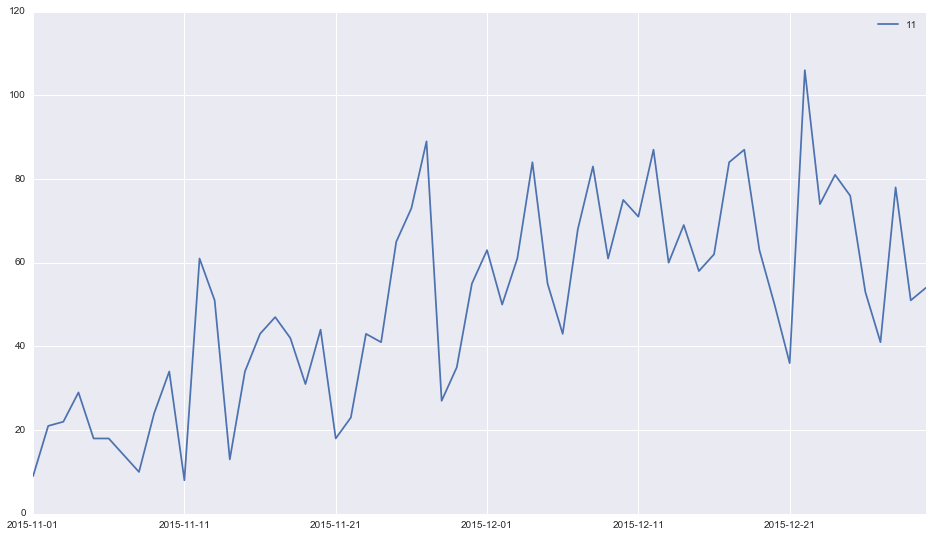

In [583]:
draw_id(11,start_date='2015-11-01',end_date='2015-12-30')

In [278]:
def cal_start_day(x):
    for day in dateRange('2015-07-01','2016-10-31'):
        if x[day]>0 :
            return day
    

shop_info['start_day'] = shop_info.apply(lambda x:cal_start_day(x),axis =1)

### 计算每周count

In [4]:

#  占个格子 &&  cal avg sales count each day
total_day = pd.to_datetime('2016-11-01').date()-pd.to_datetime('2015-07-01').date() 
total_day = total_day.days
total_week = total_day / 7  # 69个
start_day = pd.to_datetime('2016-11-01').date() - datetime.timedelta(total_week*7)
#print start_day
for week_number in range(total_week): # 0~68
    start_day_of_week = start_day +  datetime.timedelta(week_number*7) 
    end_day_of_week = start_day_of_week + datetime.timedelta(6)
    start_day_of_week =   start_day_of_week.strftime("%Y-%m-%d")
    end_day_of_week = end_day_of_week.strftime("%Y-%m-%d")
    print start_day_of_week,end_day_of_week
    shop_info['wk_'+str(week_number)] = shop_info.loc[:,start_day_of_week:end_day_of_week].mean(axis=1)


2015-07-07 2015-07-13
2015-07-14 2015-07-20
2015-07-21 2015-07-27
2015-07-28 2015-08-03
2015-08-04 2015-08-10
2015-08-11 2015-08-17
2015-08-18 2015-08-24
2015-08-25 2015-08-31
2015-09-01 2015-09-07
2015-09-08 2015-09-14
2015-09-15 2015-09-21
2015-09-22 2015-09-28
2015-09-29 2015-10-05
2015-10-06 2015-10-12
2015-10-13 2015-10-19
2015-10-20 2015-10-26
2015-10-27 2015-11-02
2015-11-03 2015-11-09
2015-11-10 2015-11-16
2015-11-17 2015-11-23
2015-11-24 2015-11-30
2015-12-01 2015-12-07
2015-12-08 2015-12-14
2015-12-15 2015-12-21
2015-12-22 2015-12-28
2015-12-29 2016-01-04
2016-01-05 2016-01-11
2016-01-12 2016-01-18
2016-01-19 2016-01-25
2016-01-26 2016-02-01
2016-02-02 2016-02-08
2016-02-09 2016-02-15
2016-02-16 2016-02-22
2016-02-23 2016-02-29
2016-03-01 2016-03-07
2016-03-08 2016-03-14
2016-03-15 2016-03-21
2016-03-22 2016-03-28
2016-03-29 2016-04-04
2016-04-05 2016-04-11
2016-04-12 2016-04-18
2016-04-19 2016-04-25
2016-04-26 2016-05-02
2016-05-03 2016-05-09
2016-05-10 2016-05-16
2016-05-17

### 计算最后三周 中位数、极大值 、极小值

In [165]:
wk1=['2016-10-11','2016-10-17']
wk2=['2016-10-18','2016-10-24']
wk3=['2016-10-25','2016-10-31']
def cal_median_wkn(x,wkn):
    return sorted(x[wkn[0]:wkn[1]].tolist())[3]
def cal_max_wkn(x,wkn):
    return max(x[wkn[0]:wkn[1]].tolist())
def cal_min_wkn(x,wkn):
    return min(x[wkn[0]:wkn[1]].tolist())

shop_info['median_wk_1'] = shop_info.apply(lambda x: cal_median_wkn(x,wk1),axis=1)
shop_info['median_wk_2'] = shop_info.apply(lambda x: cal_median_wkn(x,wk2),axis=1)
shop_info['median_wk_3'] = shop_info.apply(lambda x: cal_median_wkn(x,wk3),axis=1)
shop_info['min_wk_1'] = shop_info.apply(lambda x: cal_min_wkn(x,wk1),axis=1)
shop_info['min_wk_2'] = shop_info.apply(lambda x: cal_min_wkn(x,wk2),axis=1)
shop_info['min_wk_3'] = shop_info.apply(lambda x: cal_min_wkn(x,wk3),axis=1)
shop_info['max_wk_1'] = shop_info.apply(lambda x: cal_max_wkn(x,wk1),axis=1)
shop_info['max_wk_2'] = shop_info.apply(lambda x: cal_max_wkn(x,wk2),axis=1)
shop_info['max_wk_3'] = shop_info.apply(lambda x: cal_max_wkn(x,wk3),axis=1)


### 计算最后三周 极大值 、极小值是周几

In [170]:
def cal_max_wkn_day(x,wkn):
    if wkn == ['2016-10-11','2016-10-17'] :  max_wk = x['max_wk_1']
    if wkn == ['2016-10-18','2016-10-24']:  max_wk = x['max_wk_2']
    if wkn == ['2016-10-25','2016-10-31']:  max_wk = x['max_wk_3']
    count = 1
    for i in x[wkn[0]:wkn[1]].tolist():
        if i == max_wk:
            return count
        count +=1
    return 0
def cal_min_wkn_day(x,wkn):
    if wkn == ['2016-10-11','2016-10-17'] :  min_wk = x['min_wk_1']
    if wkn == ['2016-10-18','2016-10-24']:  min_wk = x['min_wk_2']
    if wkn == ['2016-10-25','2016-10-31']:  min_wk = x['min_wk_3']
    count = 1
    for i in x[wkn[0]:wkn[1]].tolist():
        if i == min_wk:
            return count
        count +=1
    return 0
    
shop_info['max_wk_1_day'] = shop_info.apply(lambda x: cal_max_wkn_day(x,wk1),axis=1)
shop_info['max_wk_2_day'] = shop_info.apply(lambda x: cal_max_wkn_day(x,wk2),axis=1)
shop_info['max_wk_3_day'] = shop_info.apply(lambda x: cal_max_wkn_day(x,wk3),axis=1)
    
shop_info['min_wk_1_day'] = shop_info.apply(lambda x: cal_min_wkn_day(x,wk1),axis=1)
shop_info['min_wk_2_day'] = shop_info.apply(lambda x: cal_min_wkn_day(x,wk2),axis=1)
shop_info['min_wk_3_day'] = shop_info.apply(lambda x: cal_min_wkn_day(x,wk3),axis=1)

In [190]:
v1 = np.array(shop_info.loc[1,wk1[0]:wk1[1]].tolist())
v2 = np.array(shop_info.loc[1,wk2[0]:wk2[1]].tolist())

v1.dot(v2) / (np.sqrt(np.sum(np.square(v1))) + np.sqrt(np.sum(np.square(v2))))

302.6868230760067

### 计算倒数三周之间的余弦相似度

In [196]:
wk1=['2016-10-11','2016-10-17']
wk2=['2016-10-18','2016-10-24']
wk3=['2016-10-25','2016-10-31']
def cal_cos_sim_between(x,wka,wkb):
    wka_vec =  np.array(x[wka[0]:wka[1]].tolist())
    wkb_vec =  np.array(x[wkb[0]:wkb[1]].tolist())
    sim = wka_vec.dot(wkb_vec) / (np.sqrt(np.sum(np.square(wka_vec))) * np.sqrt(np.sum(np.square(wkb_vec))))
    return sim
shop_info['cos_sim_between_wk_1_2'] = shop_info.apply(lambda x: cal_cos_sim_between(x,wk1,wk2),axis=1)
shop_info['cos_sim_between_wk_2_3'] = shop_info.apply(lambda x: cal_cos_sim_between(x,wk2,wk3),axis=1)
shop_info['cos_sim_between_wk_1_3'] = shop_info.apply(lambda x: cal_cos_sim_between(x,wk1,wk3),axis=1)

In [202]:
shop_info['cos_sim_between_wk_1_2'].replace(np.NaN,0.0,inplace=True)
shop_info['cos_sim_between_wk_2_3'].replace(np.NaN,0.0,inplace=True)
shop_info['cos_sim_between_wk_1_3'].replace(np.NaN,0.0,inplace=True)

### 计算每一周与下一周之间的余弦相似度

In [247]:
def cal_cos_sim(x,start_day_of_week,end_day_of_week,start_day_of_next_week,end_day_of_next_week):
    wka_vec =  np.array(x[start_day_of_week:end_day_of_week].tolist())
    wkb_vec =  np.array(x[start_day_of_next_week:end_day_of_next_week].tolist())
    sim = wka_vec.dot(wkb_vec) / (np.sqrt(np.sum(np.square(wka_vec))) * np.sqrt(np.sum(np.square(wkb_vec))))
    return sim 
    
    
total_day = pd.to_datetime('2016-11-01').date()-pd.to_datetime('2015-07-01').date() 
total_day = total_day.days
total_week = total_day / 7
start_day = pd.to_datetime('2015-07-07').date()
for week_number in range(total_week-1): # 0 ~ 68-1
    start_day_of_week = start_day +  datetime.timedelta(week_number*7) 
    end_day_of_week = start_day_of_week + datetime.timedelta(6)
    start_day_of_next_week = start_day_of_week + datetime.timedelta(7)
    end_day_of_next_week = end_day_of_week + datetime.timedelta(7)
    start_day_of_week = start_day_of_week.strftime("%Y-%m-%d")
    end_day_of_week = end_day_of_week.strftime("%Y-%m-%d")
    start_day_of_next_week = start_day_of_next_week.strftime("%Y-%m-%d")
    end_day_of_next_week = end_day_of_next_week.strftime("%Y-%m-%d")
    shop_info['cos_sim_wk_'+str(week_number)] = shop_info.apply(lambda x: cal_cos_sim(x,start_day_of_week,end_day_of_week,start_day_of_next_week,end_day_of_next_week),axis=1)

### 找出稳定时间段（时间段类各周的余弦相似度高）

In [ ]:
def show_stable_period_id(id):
    stable_periods = shop_info.loc[id,'stable_period']
    for sp in stable_periods:
        print 'id :',id, week_to_date(sp[0])[0], week_to_date(sp[1])[1]
        

In [564]:
def cal_stable_period(x,base_sim):
    stable_period = []
    next_start_wk = 0
    for wk in range(0,66):
        if next_start_wk != 0 and wk!= next_start_wk : 
            #print 'next_start_wk =',next_start_wk,'continue'
            continue
        #print wk
        next_start_wk = 0
        if x['cos_sim_wk_'+str(wk)] >  base_sim:
            for wknext in range(wk + 1,66):
                if x['cos_sim_wk_'+str(wknext)] > base_sim :
                    pass
                else:
                    if wknext - wk >= 3 : 
                        stable_period.append([wk,wknext]) # wk~wknext(不包括wknext)
                        next_start_wk = wknext
                    else:
                        next_start_wk = 0
                    break #结束子循环
    return stable_period
shop_info['stable_period'] = shop_info.apply(lambda x: cal_stable_period(x,0.9),axis = 1)

In [568]:
show_stable_period_id(8)

In [566]:
shop_info['stable_period'] # wk~wknext(不包括wknext) 

1                                              [[14, 22]]
2                          [[23, 28], [32, 49], [51, 64]]
3                                                      []
4                                              [[54, 61]]
5                                              [[43, 50]]
6                                    [[32, 54], [58, 61]]
7                                     [[1, 22], [23, 64]]
8                                                      []
9                                    [[17, 22], [23, 30]]
10                                             [[54, 64]]
11                         [[19, 22], [23, 30], [33, 61]]
12                         [[32, 36], [37, 40], [48, 64]]
13                                             [[38, 58]]
14                          [[7, 11], [13, 21], [23, 29]]
15                                             [[53, 61]]
16      [[9, 21], [23, 30], [31, 39], [41, 44], [46, 4...
17                          [[3, 11], [13, 21], [23, 30]]
18            

In [546]:
for id in shop_info.index.tolist():
    show_stable_period_id(id)

id : 1 2016-06-28 2016-07-25
id : 1 2016-08-09 2016-09-05
id : 2 2016-05-03 2016-05-23
id : 2 2016-08-16 2016-09-05
id : 7 2016-06-14 2016-07-11
id : 9 2016-02-23 2016-03-21
id : 9 2016-04-26 2016-05-30
id : 9 2016-06-21 2016-09-19
id : 13 2016-06-07 2016-08-15
id : 14 2016-01-05 2016-01-25
id : 19 2016-06-14 2016-07-25
id : 19 2016-08-09 2016-08-29
id : 22 2015-11-03 2015-11-23
id : 23 2016-05-03 2016-05-30
id : 23 2016-06-14 2016-07-04
id : 23 2016-08-02 2016-09-05
id : 27 2016-08-09 2016-09-05
id : 31 2016-07-19 2016-09-05
id : 32 2016-02-16 2016-03-21
id : 32 2016-06-14 2016-07-25
id : 34 2016-04-05 2016-04-25
id : 34 2016-06-28 2016-08-01
id : 34 2016-08-09 2016-09-05
id : 35 2016-06-14 2016-08-15
id : 40 2016-08-09 2016-09-05
id : 43 2016-08-09 2016-08-29
id : 44 2016-06-28 2016-07-25
id : 46 2016-07-19 2016-09-05
id : 48 2016-08-02 2016-09-05
id : 49 2015-12-29 2016-01-18
id : 49 2016-02-09 2016-03-07
id : 49 2016-05-03 2016-05-30
id : 51 2015-10-20 2015-11-23
id : 53 2016-07-05

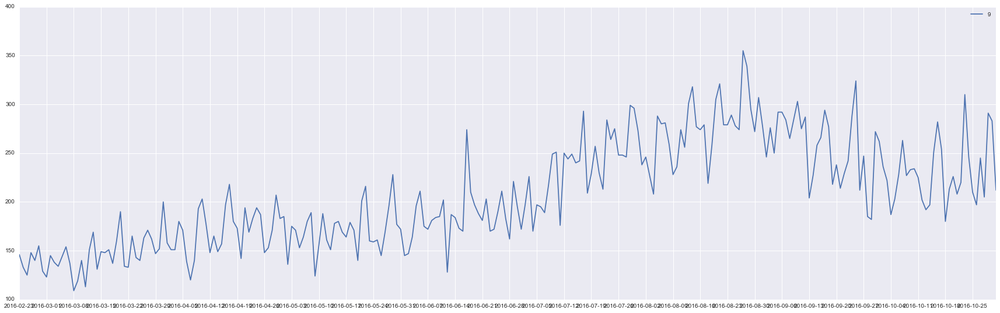

In [563]:
draw_id(9,by_week=True,start_date='2016-02-23',end_date='2016-10-31',figsize=(30,9))

In [567]:
shop_info.loc[8,'cos_sim_wk_0':'cos_sim_wk_67']

cos_sim_wk_0          NaN
cos_sim_wk_1          NaN
cos_sim_wk_2          NaN
cos_sim_wk_3          NaN
cos_sim_wk_4          NaN
cos_sim_wk_5          NaN
cos_sim_wk_6          NaN
cos_sim_wk_7          NaN
cos_sim_wk_8          NaN
cos_sim_wk_9          NaN
cos_sim_wk_10         NaN
cos_sim_wk_11         NaN
cos_sim_wk_12         NaN
cos_sim_wk_13         NaN
cos_sim_wk_14         NaN
cos_sim_wk_15         NaN
cos_sim_wk_16         NaN
cos_sim_wk_17         NaN
cos_sim_wk_18         NaN
cos_sim_wk_19         NaN
cos_sim_wk_20         NaN
cos_sim_wk_21         NaN
cos_sim_wk_22         NaN
cos_sim_wk_23         NaN
cos_sim_wk_24         NaN
cos_sim_wk_25         NaN
cos_sim_wk_26         NaN
cos_sim_wk_27         NaN
cos_sim_wk_28         NaN
cos_sim_wk_29         NaN
                   ...   
cos_sim_wk_38         NaN
cos_sim_wk_39         NaN
cos_sim_wk_40         NaN
cos_sim_wk_41         NaN
cos_sim_wk_42         NaN
cos_sim_wk_43         NaN
cos_sim_wk_44         NaN
cos_sim_wk_4

SyntaxError: invalid syntax (<ipython-input-444-9f166a0ee022>, line 1)

## 定义的数据可视化函数

In [500]:
def draw_week_id(id,start_date='wk_0',end_date='wk_68',figsieze=(16,9)):
    shop_info.loc[id,start_date:end_date].T.plot(figsize=(16,9))
def draw_week_ids(ids,start_date='wk_0',end_date='wk_68',figsieze=(16,9)):
    shop_info.loc[ids,start_date:end_date].T.plot(figsize=(16,9))
def draw_ids(ids,start_date='2015-07-01',end_date='2016-10-31',by_week=False,figsize=(16,9)):
    if by_week:
        xmajorLocator = MultipleLocator(7) #将x轴次刻度标签设置为7的倍数
        ax = plt.subplot(111) 
        ax.xaxis.set_major_locator(xmajorLocator)
        shop_info.loc[ids,start_date:end_date].T.plot(figsize=figsize,ax=ax)
    else: shop_info.loc[ids,start_date:end_date].T.plot(figsize=figsize)
    plt.show()
def draw_ids_avg(ids,start_date='2015-07-01',end_date='2016-10-31',by_week=True,figsize=(70,10)):
    if by_week:
        xmajorLocator   = MultipleLocator(7) #将x轴次刻度标签设置为7的倍数
        ax = plt.subplot(111) 
        ax.xaxis.set_major_locator(xmajorLocator)
    shop_info.loc[ids,start_date:end_date].mean(axis=0).plot(figsize=figsize)
    plt.show()
def draw_ids_diff(ids,start_date='2015-07-01',end_date='2016-10-31',by_week=False,figsize=(16,9)):  
    if by_week:
        xmajorLocator   = MultipleLocator(7) #将x轴次刻度标签设置为7的倍数
        ax = plt.subplot(111) 
        ax.xaxis.set_major_locator(xmajorLocator)
    (shop_info.loc[ids[0],start_date:end_date]-shop_info.loc[ids[1],start_date:end_date]).plot(figsize=figsize)
def draw_id(id,start_date='2015-07-01',end_date='2016-10-31',by_week=False,figsize=(16,9)):
    if by_week:
        xmajorLocator = MultipleLocator(7) #将x轴次刻度标签设置为7的倍数
        ax = plt.subplot(111) 
        ax.xaxis.set_major_locator(xmajorLocator)
    shop_info.loc[id,start_date:end_date].plot(legend=True,figsize=figsize)



## 最后三周出现零值的

In [151]:
ids_zero_in_last_three_week = {}
for date in dateRange('2016-10-11','2016-10-31'):
    for id in shop_info[shop_info[date]==0]['shop_id'].tolist():
        if id not in ids_zero_in_last_three_week.keys():
            ids_zero_in_last_three_week[id] = 0
        ids_zero_in_last_three_week[id] += 1
#print sorted(ids_zero_in_last_three_week.keys())
#print ids_zero_in_last_three_week.keys()

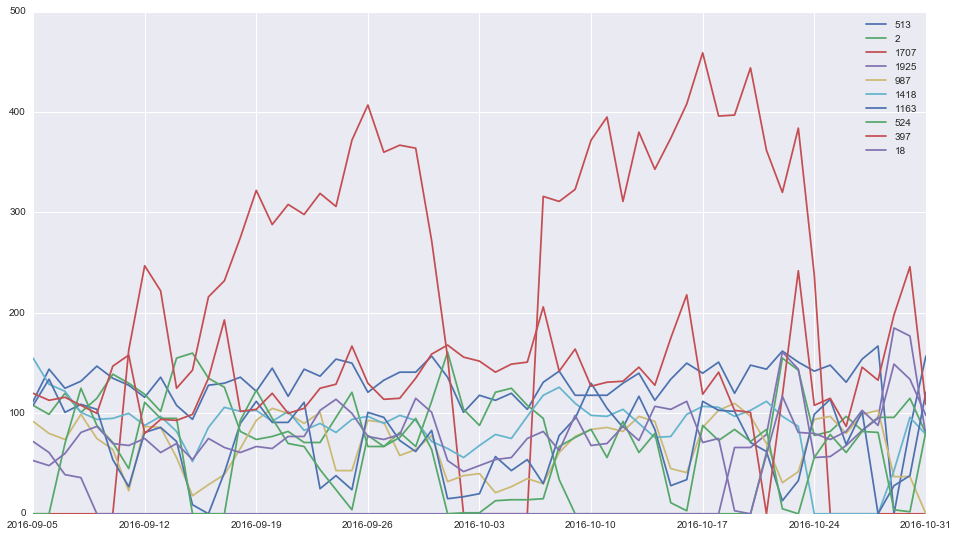

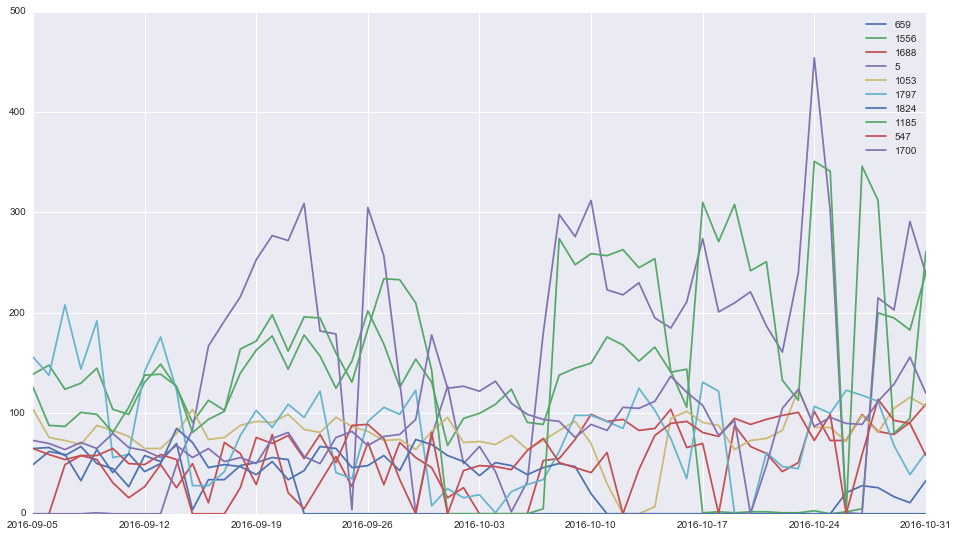

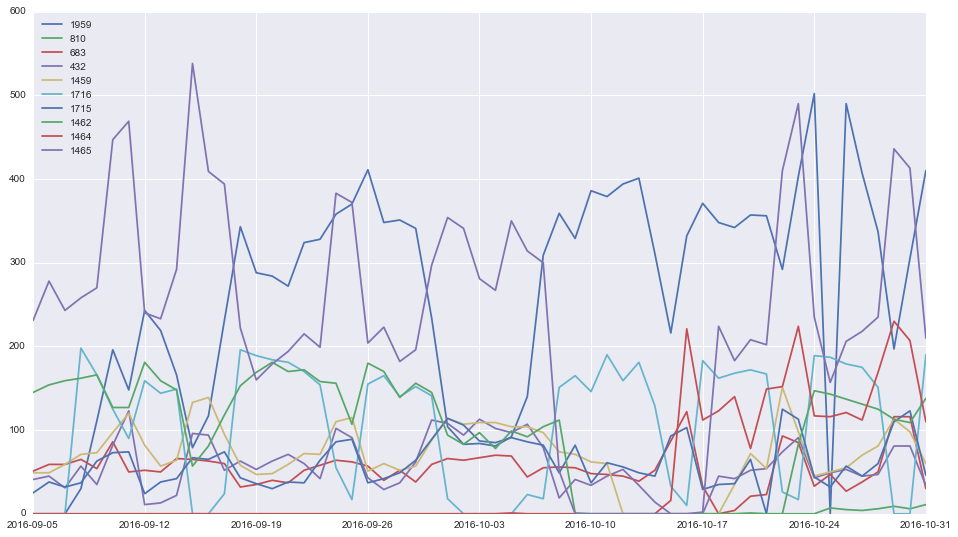

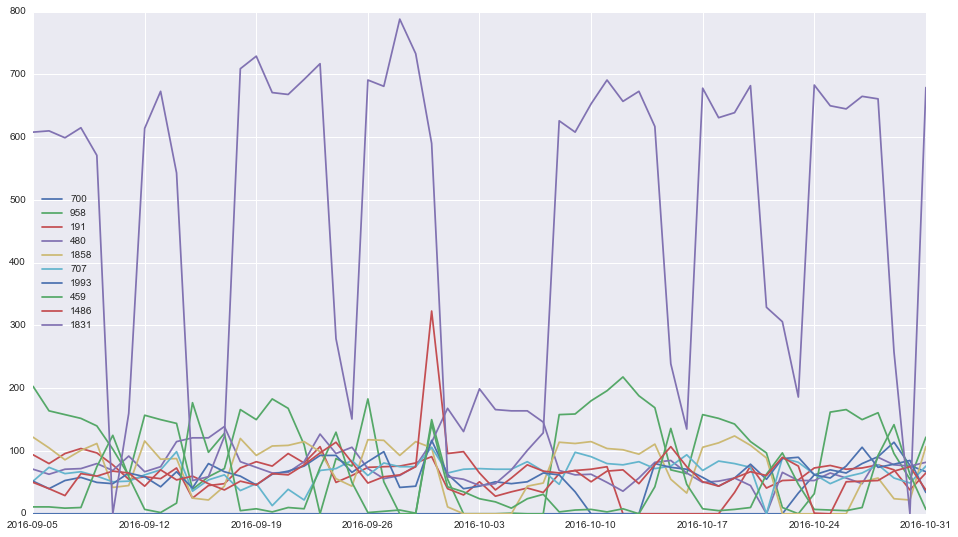

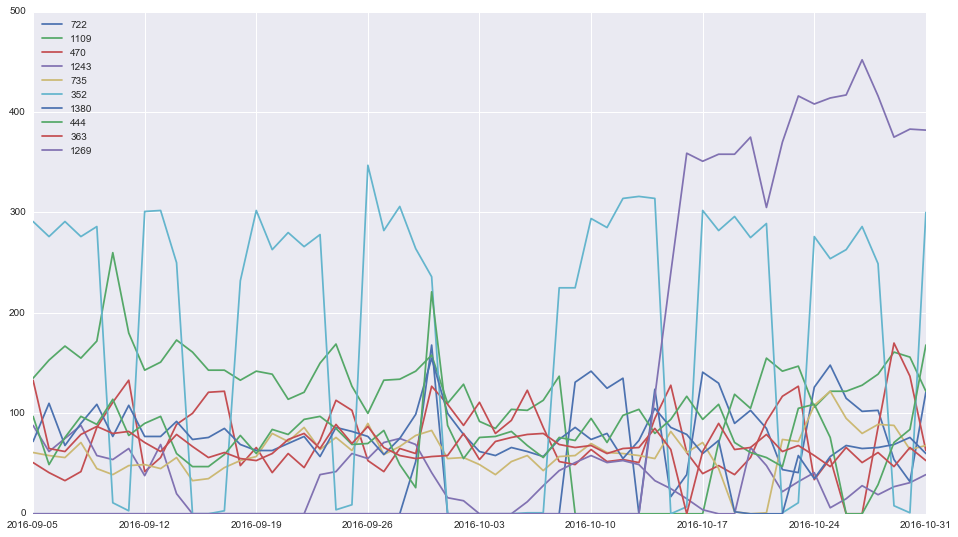

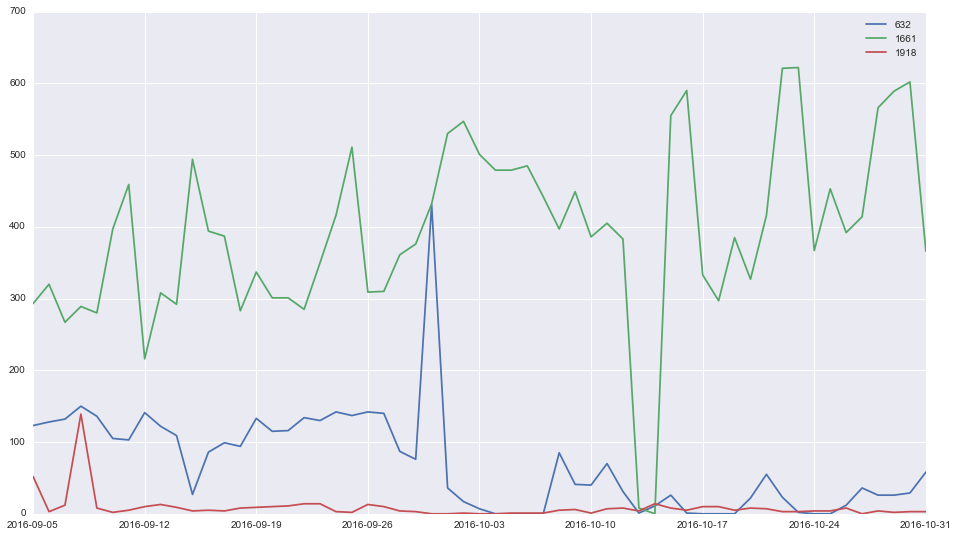

In [410]:
def draw_id_group_size(n):
    for i in range(len(ids_zero_in_last_three_week.keys())/n + 1):
        s = 0 + i*10
        e = 10 + i*10 
        if i == len(ids_zero_in_last_three_week.keys())/n : e = len(ids_zero_in_last_three_week.keys())
        draw_ids(ids_zero_in_last_three_wek.keys()[s:e],start_date='2016-09-05',end_date='2016-10-31',by_week=True)
draw_id_group_size(10)

## 最后三周均值很低的

103


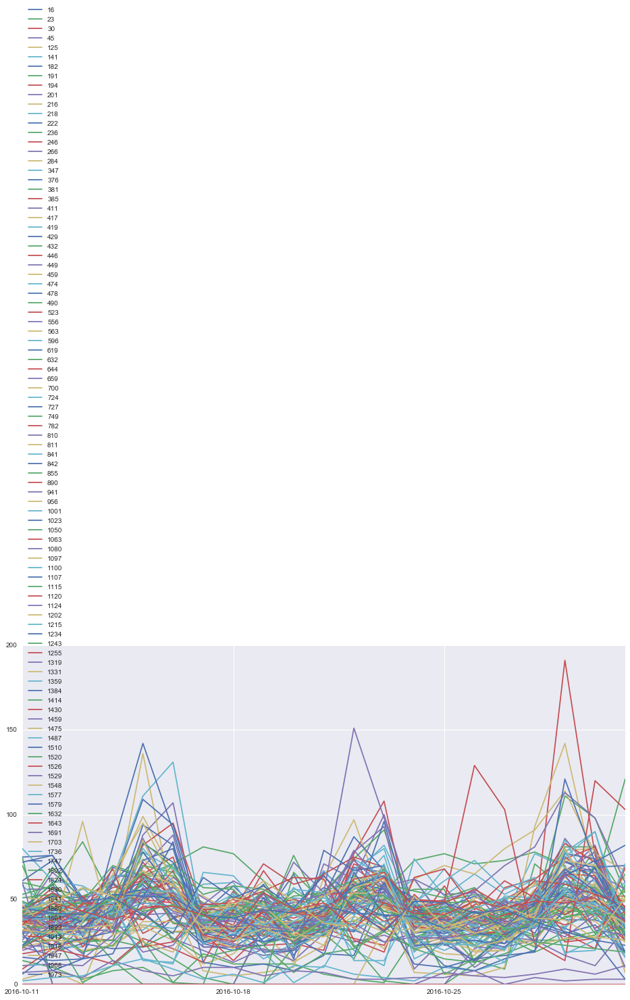

In [105]:
ids_low_count_in_last_3_wk = shop_info[shop_info.loc[:,'2016-10-11':'2016-10-31'].mean(axis=1)<50].index.tolist()
print len(ids_low_count_in_last_3_wk)
draw_ids(ids_low_count_in_last_3_wk,start_date='2016-10-11',end_date='2016-10-31',by_week=True)

13


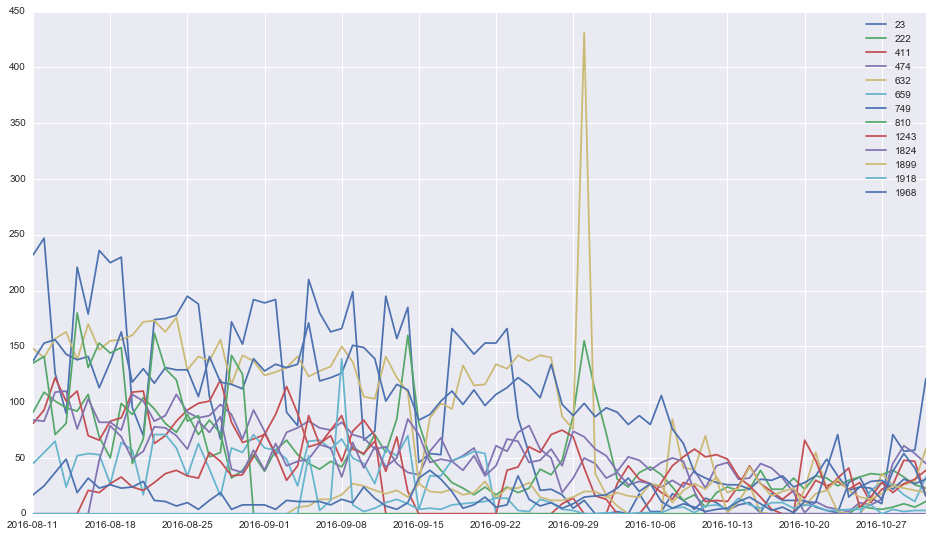

In [167]:
ids_low_count_in_last_3_wk = shop_info[shop_info.loc[:,'2016-10-11':'2016-10-31'].mean(axis=1)<30].index.tolist()
print len(ids_low_count_in_last_3_wk)
draw_ids(ids_low_count_in_last_3_wk,start_date='2016-08-11',end_date='2016-10-31',by_week=True)

有下降的，也有本来均值很低的

## 最后三周出现相对三周内极高点的

70


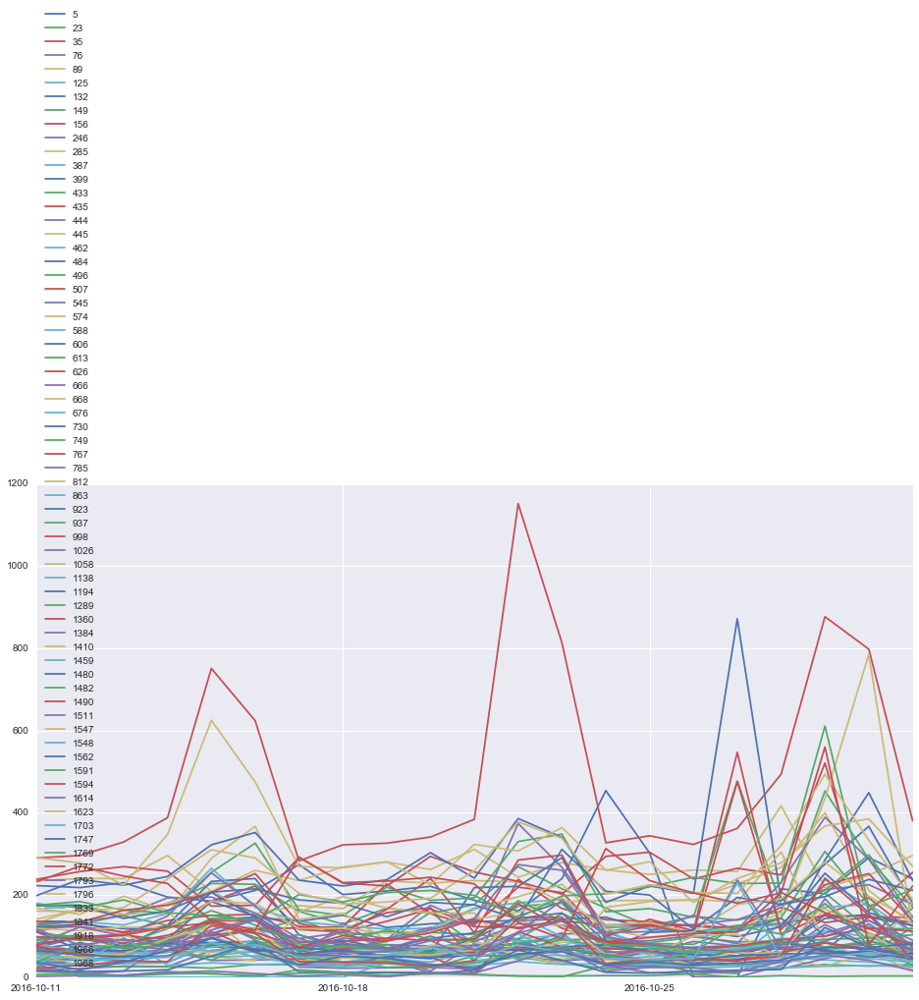

In [257]:
ids_highest_point_error_compared_to_last_three_days = []
def cal_highest_point_error_compared_to_last_three_days(x):
    sales_list = sorted(x['2016-10-11':'2016-10-31'].tolist(),reverse=True)
    if sales_list[1] > 0:
        if 1.0 * sales_list[0] / sales_list[1] > 1.3:
            ids_highest_point_error_compared_to_last_three_days.append(x['shop_id'])
shop_info.apply(lambda x: cal_highest_point_error_compared_to_last_three_days(x) ,axis=1)
print len(ids_highest_point_error_compared_to_last_three_days)

draw_ids(ids_highest_point_error_compared_to_last_three_days,start_date='2016-10-11',end_date='2016-10-31',by_week=True)

## 最后三周出现相对三周内极低点的

180


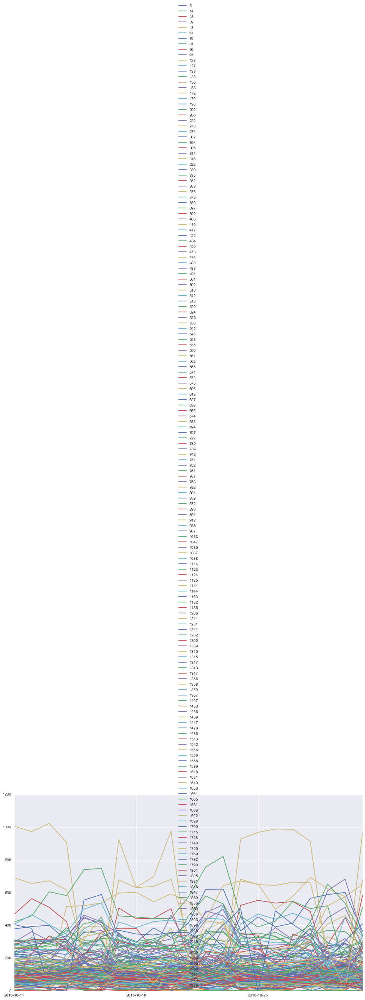

In [258]:
ids_lowest_point_error_compared_to_last_three_days = []
def cal_lowest_point_error_compared_to_last_three_days(x):
    sales_list = sorted(x['2016-10-11':'2016-10-31'].tolist())
    if sales_list[1] > 0:
        if 1.0 * sales_list[0] / sales_list[1] < 0.7:
            ids_lowest_point_error_compared_to_last_three_days.append(x['shop_id'])
shop_info.apply(lambda x: cal_lowest_point_error_compared_to_last_three_days(x) ,axis=1)
print len(ids_lowest_point_error_compared_to_last_three_days)

draw_ids(ids_lowest_point_error_compared_to_last_three_days,start_date='2016-10-11',end_date='2016-10-31',by_week=True)

## 最后三周出现相对三周外极高点的

## 最后三周出现相对三周外极低点的

## 最后三天出现零值的

[513, 987, 1707, 1716, 1824, 1831]
[1824, 513, 1831, 1707, 1716, 987]


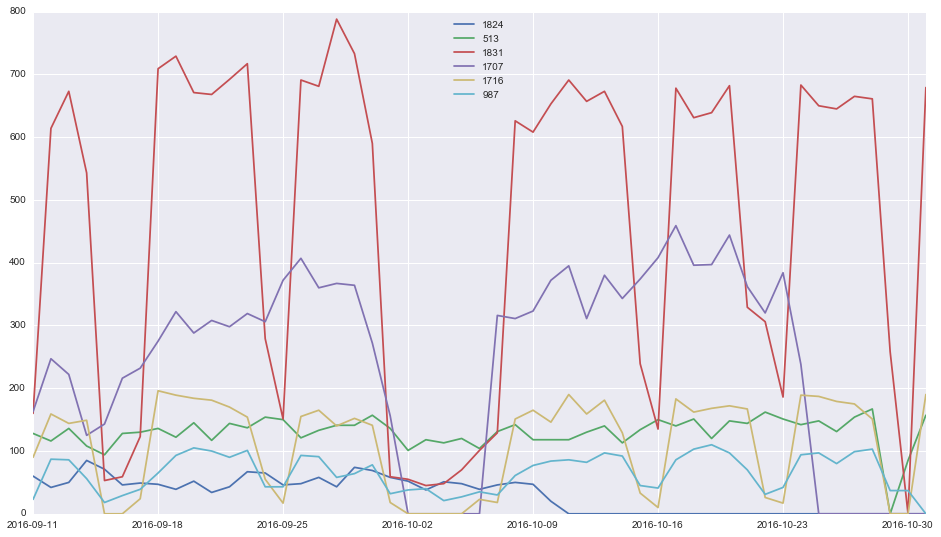

In [133]:
ids_zero_in_last_three_week = {}
for date in dateRange('2016-10-29','2016-10-31'):
    for id in shop_info[shop_info[date]==0]['shop_id'].tolist():
        if id not in ids_zero_in_last_three_week.keys():
            ids_zero_in_last_three_week[id] = 0
        ids_zero_in_last_three_week[id] += 1
print sorted(ids_zero_in_last_three_week.keys())
print ids_zero_in_last_three_week.keys()
def draw_id_group_size(n):
    for i in range(len(ids_zero_in_last_three_week.keys())/n + 1):
        s = 0 + i*10
        e = 10 + i*10 
        if i == len(ids_zero_in_last_three_week.keys())/n : e = len(ids_zero_in_last_three_week.keys())
        draw_ids(ids_zero_in_last_three_week.keys()[s:e],start_date='2016-09-11',end_date='2016-10-31',by_week=True)
draw_id_group_size(10)

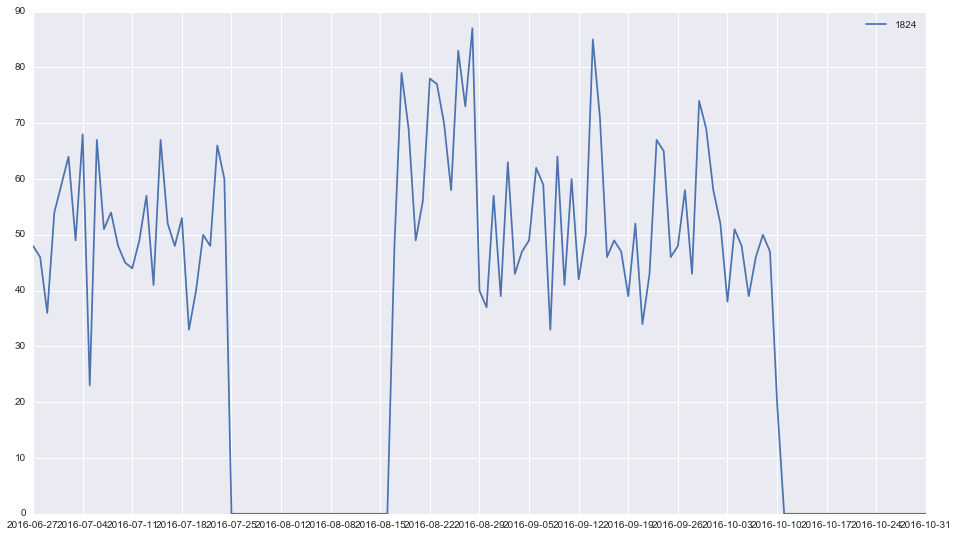

In [407]:
draw_id(1824,start_date='2016-06-27',by_week=True)

## 倒数第一周与第二周相对差过大

In [71]:
shop_info.head()

,shop_id,city_name,location_id,per_pay,score,comment_cnt,shop_level,cate_1_name,cate_2_name,cate_3_name,...,wk_59,wk_60,wk_61,wk_62,wk_63,wk_64,wk_65,wk_66,wk_67,wk_68
1,1,湖州,885,8,4.0,12.0,2,美食,休闲茶饮,饮品/甜点,...,250.571429,256.857143,252.857143,220.857143,232.428571,240.142857,252.571429,242.857143,217.000000,231.714286
2,2,哈尔滨,64,19,NaN,NaN,1,超市便利店,超市,NaN,...,103.857143,116.857143,117.571429,119.142857,83.571429,97.142857,69.000000,0.000000,62.428571,92.714286
3,3,南昌,774,5,3.0,2.0,0,美食,休闲茶饮,奶茶,...,86.571429,79.000000,78.571429,84.285714,76.857143,104.142857,87.000000,78.428571,88.571429,83.571429
4,4,天津,380,18,NaN,NaN,1,超市便利店,超市,NaN,...,142.714286,148.571429,143.857143,137.857143,124.000000,117.142857,109.285714,120.714286,122.000000,126.428571
5,5,杭州,263,2,2.0,2.0,0,美食,休闲食品,生鲜水果,...,0.000000,0.000000,0.142857,137.285714,218.285714,101.428571,163.142857,219.428571,239.142857,178.714286


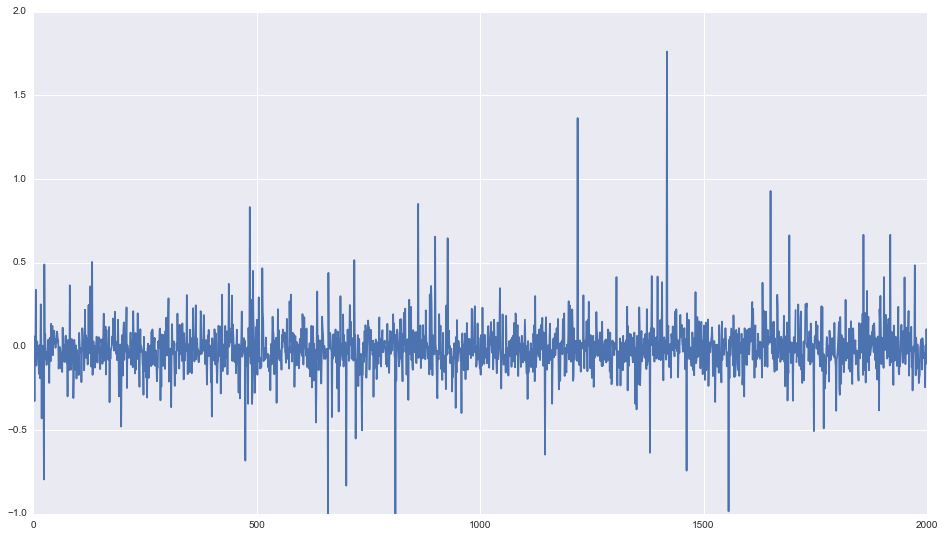

In [78]:
shop_info['relatively_diff_between_wk_67_68'] = (shop_info['wk_67']-shop_info['wk_68'])/shop_info['wk_68']
shop_info['relatively_diff_between_wk_67_68'].plot(figsize=(16,9))

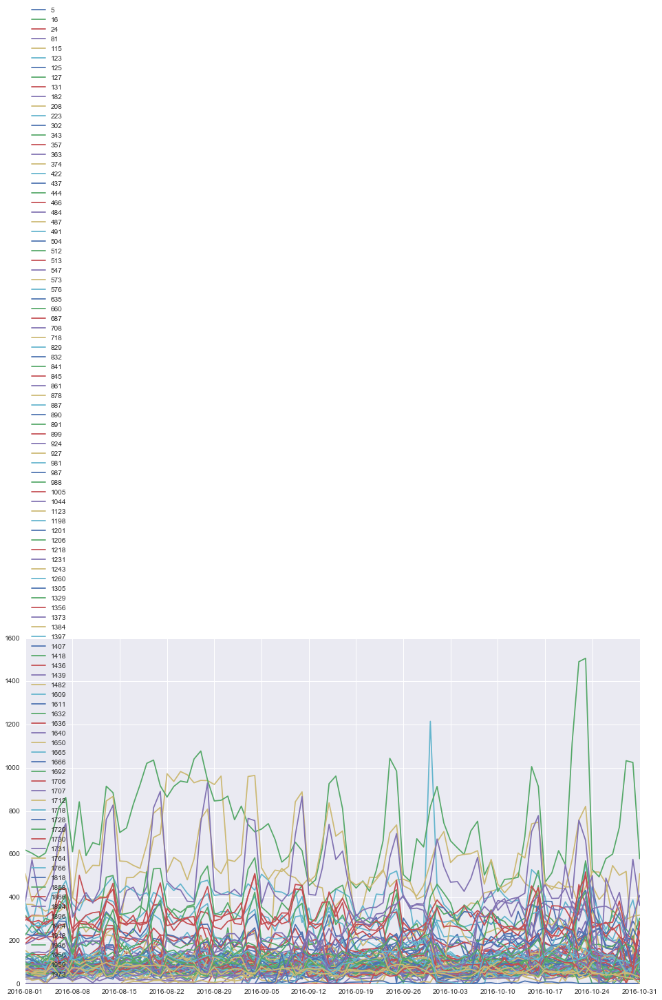

In [129]:
ids_relatively_diff_between_wk_67_68_high = shop_info['relatively_diff_between_wk_67_68'][shop_info['relatively_diff_between_wk_67_68']>0.2].index.tolist()
draw_ids(ids_relatively_diff_between_wk_67_68_high,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

大概分为两种，一种是count较大出现第三周下降的，一种是本身count小因此波动比较大的

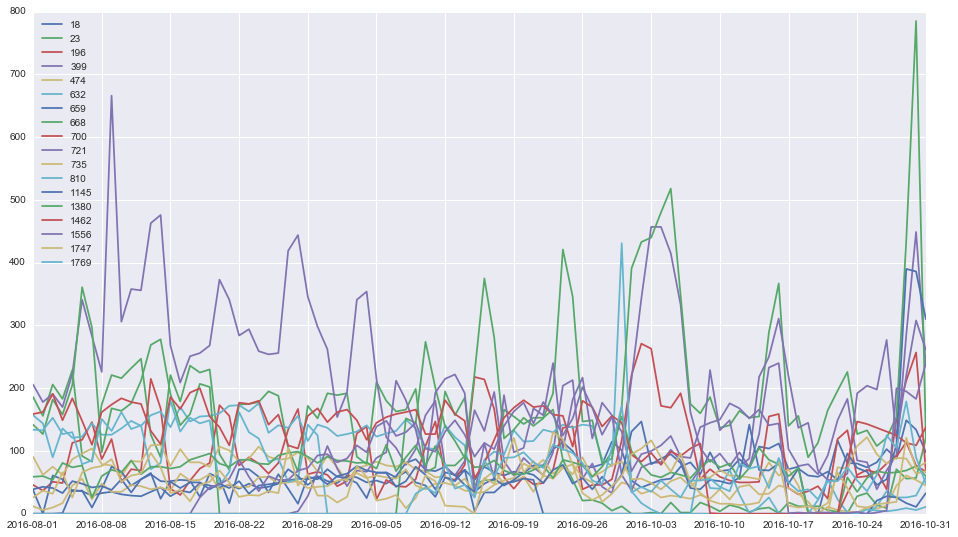

In [130]:
ids_relatively_diff_between_wk_67_68_low = shop_info['relatively_diff_between_wk_67_68'][shop_info['relatively_diff_between_wk_67_68']<-0.4].index.tolist()
draw_ids(ids_relatively_diff_between_wk_67_68_low,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

## 倒数第二周与第三周相对差过大

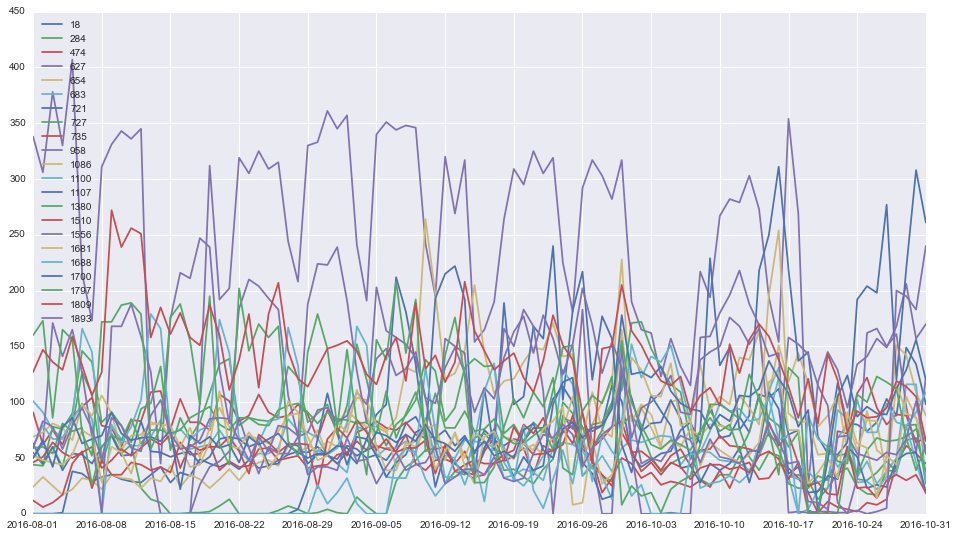

In [131]:
shop_info['relatively_diff_between_wk_66_67'] = (shop_info['wk_66']-shop_info['wk_67'])/shop_info['wk_67']
ids_relatively_diff_between_wk_66_67_high = shop_info['relatively_diff_between_wk_66_67'][shop_info['relatively_diff_between_wk_66_67']>0.4].index.tolist()
draw_ids(ids_relatively_diff_between_wk_66_67_high,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

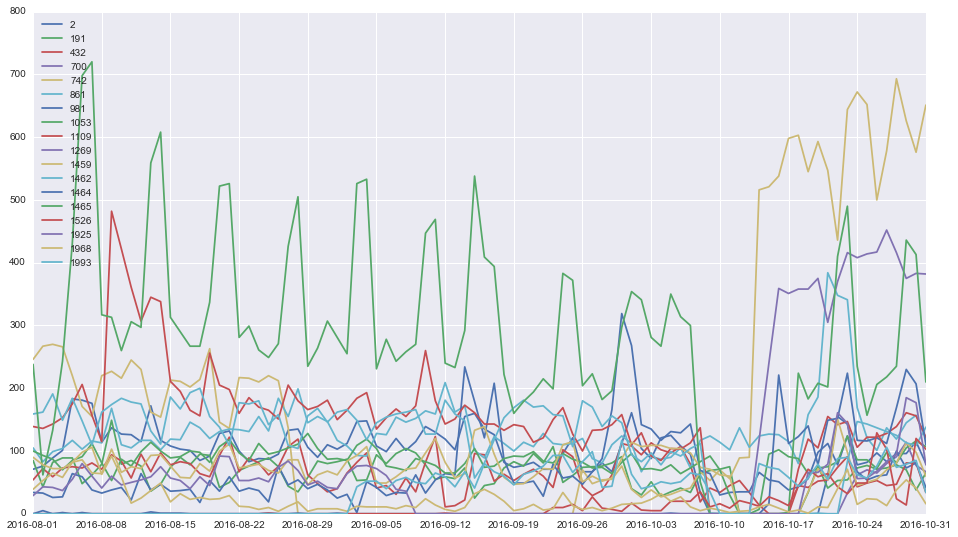

In [132]:
ids_relatively_diff_between_wk_66_67_low = shop_info['relatively_diff_between_wk_66_67'][shop_info['relatively_diff_between_wk_66_67']<-0.4].index.tolist()
draw_ids(ids_relatively_diff_between_wk_66_67_low,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

## 三周的余弦相似度过低

In [242]:
ids_cos_sim_low_between_wk_1_2 = shop_info[shop_info['cos_sim_between_wk_1_2']<0.98].index.tolist()
ids_cos_sim_low_between_wk_2_3 = shop_info[shop_info['cos_sim_between_wk_2_3']<0.98].index.tolist()
ids_cos_sim_low_between_wk_1_3 = shop_info[shop_info['cos_sim_between_wk_1_2']<0.98].index.tolist()
ids_cos_sim_low_3_wk = []
ids_cos_sim_low_3_wk.extend(ids_cos_sim_low_between_wk_1_2)
ids_cos_sim_low_3_wk.extend(ids_cos_sim_low_between_wk_2_3)
ids_cos_sim_low_3_wk.extend(ids_cos_sim_low_between_wk_1_3)
ids_cos_sim_low_3_wk = list(set(ids_cos_sim_low_3_wk))
print len(ids_cos_sim_low_between_wk_1_2)
print len(ids_cos_sim_low_between_wk_2_3)
print len(ids_cos_sim_low_between_wk_1_3)
print len(ids_cos_sim_low_3_wk)
ids_cos_sim_high_3_wk =[ i  for i in shop_info.index.tolist() if i not in ids_cos_sim_low_3_wk]
print len(ids_cos_sim_high_3_wk)

582
681
582
887
1113


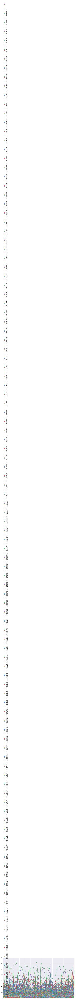

In [243]:
draw_ids(ids_cos_sim_low_3_wk,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

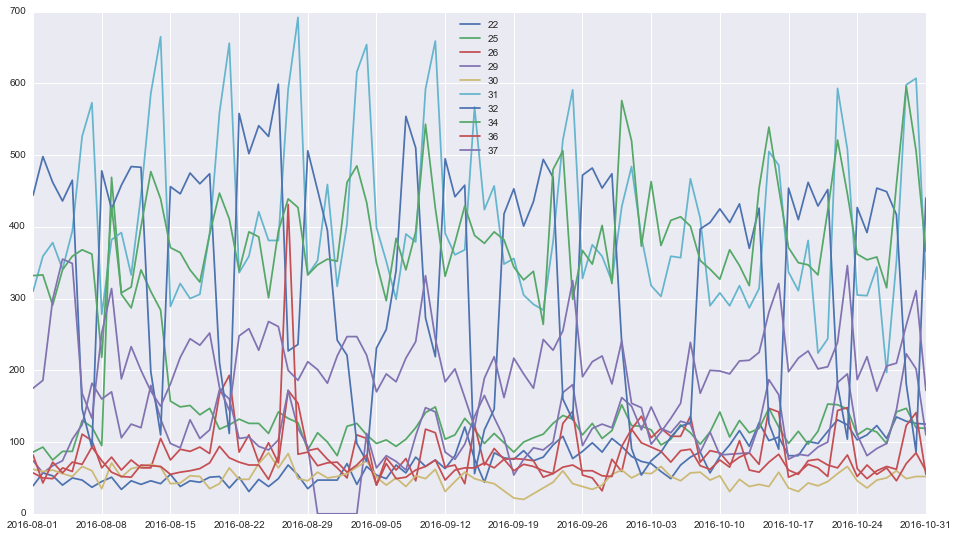

In [244]:
draw_ids(ids_cos_sim_high_3_wk[10:20],start_date='2016-08-01',end_date='2016-10-31',by_week=True)

## 最后八月才开始营业的(十几个 )  
最后九月才开始营业的就差没有了 总体稳定 基本可以忽略这个观察

In [126]:
ids_start_in_16_Aug = []
def cal_start_in_last_5_wk(x):
    for day in dateRange('2015-07-01','2016-10-31'):
        if x[day]>0:
            start_day = day
            #print start_day
            break
    if pd.to_datetime(start_day).date() >= pd.to_datetime('2016-08-01').date():
        ids_start_in_16_Aug.append(x['shop_id'])
shop_info.apply(lambda x: cal_start_in_last_5_wk(x),axis=1)


1       None
2       None
3       None
4       None
5       None
6       None
7       None
8       None
9       None
10      None
11      None
12      None
13      None
14      None
15      None
16      None
17      None
18      None
19      None
20      None
21      None
22      None
23      None
24      None
25      None
26      None
27      None
28      None
29      None
30      None
        ... 
1971    None
1972    None
1973    None
1974    None
1975    None
1976    None
1977    None
1978    None
1979    None
1980    None
1981    None
1982    None
1983    None
1984    None
1985    None
1986    None
1987    None
1988    None
1989    None
1990    None
1991    None
1992    None
1993    None
1994    None
1995    None
1996    None
1997    None
1998    None
1999    None
2000    None
dtype: object

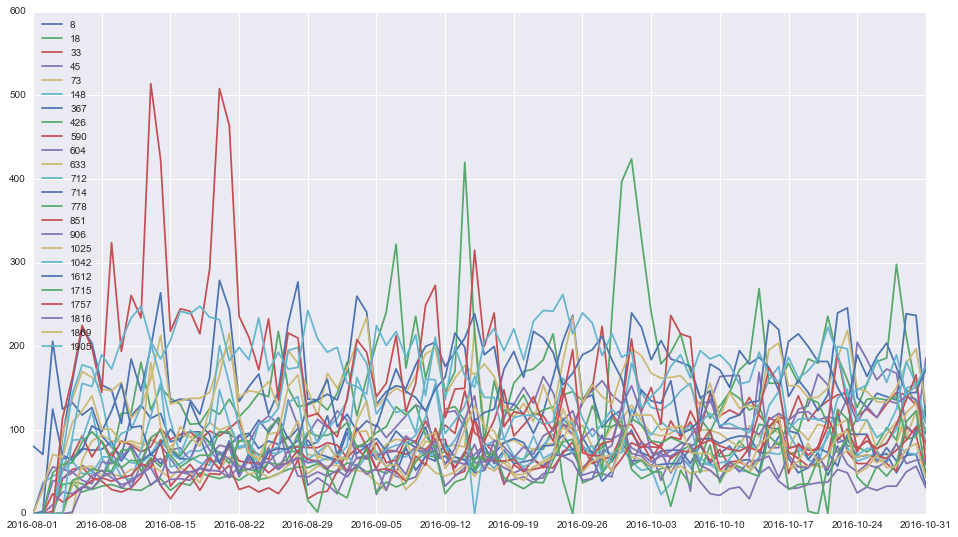

In [128]:
print len(ids_start_in_16_Aug)
draw_ids(ids_start_in_16_Aug,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

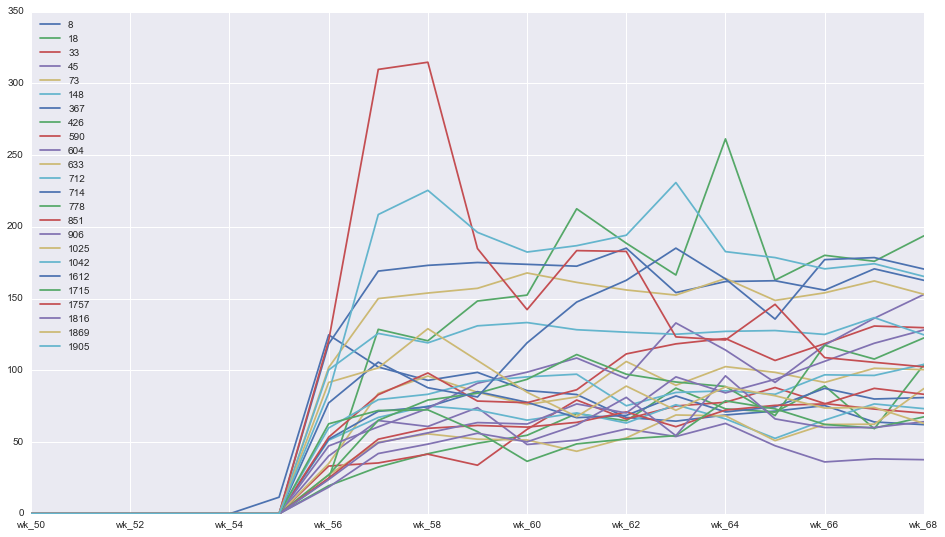

In [139]:
draw_week_ids(ids_start_in_16_Aug,start_date='wk_50',end_date='wk_68')

上升 下降 平稳都有

## 波动幅度

In [263]:
def cal_wave_range(x):
    sales_count = sorted(x['2016-10-11':'2016-10-31'].tolist())
    if sum(sales_count[18:]) == 0 :return 0
    return (sum(sales_count[18:]) - sum(sales_count[:3]))/float(sum(sales_count[18:]))
shop_info['wave_range'] = shop_info.apply(lambda x: cal_wave_range(x),axis = 1)

In [261]:
sorted(shop_info.loc[1,'2016-10-11':'2016-10-31'].tolist())

[172,
 177,
 180,
 202,
 207,
 207,
 216,
 226,
 228,
 230,
 239,
 243,
 244,
 244,
 251,
 254,
 255,
 257,
 264,
 264,
 281]

In [266]:
pd.qcut(shop_info['wave_range'],5).value_counts()

(0.532, 0.64]     401
(0.453, 0.532]    400
(0.378, 0.453]    400
[0, 0.378]        400
(0.64, 1]         399
Name: wave_range, dtype: int64

## 最后三周趋势

In [267]:
1<2<3

True

In [272]:
ids_trend_zero = []
ids_trend_up = []
ids_trend_down = []
ids_trend_flat = []
ids_trend_mess = []

def cal_trend_last_three_weeks(x):
    wk1 = x['wk_66']
    wk2 = x['wk_67']
    wk3 = x['wk_68']
    if wk1 == 0 or wk2 == 0 or wk3 == 0 :
        ids_trend_zero.append(x['shop_id'])
        return 'zero'
    if wk2/wk1 > 1.05 and wk3/wk2 > 1.05 :
        ids_trend_up.append(x['shop_id'])
        return 'up'
    if wk2/wk1 < 0.95 and wk3/wk2 < 0.95 : 
        ids_trend_down.append(x['shop_id'])
        return 'down'
    if 0.95 < wk2/wk1 < 1.05 and 0.95 < wk3/wk2 < 1.05 :
        ids_trend_flat.append(x['shop_id'])
        return 'flat'
    else : 
        ids_trend_mess.append(x['shop_id'])
        return 'mess'
    
shop_info['trend_last_three_weeks'] = shop_info.apply(lambda x: cal_trend_last_three_weeks(x),axis = 1)

In [273]:
shop_info['trend_last_three_weeks'].value_counts()

mess    1344
flat     395
up       135
down     117
zero       9
Name: trend_last_three_weeks, dtype: int64

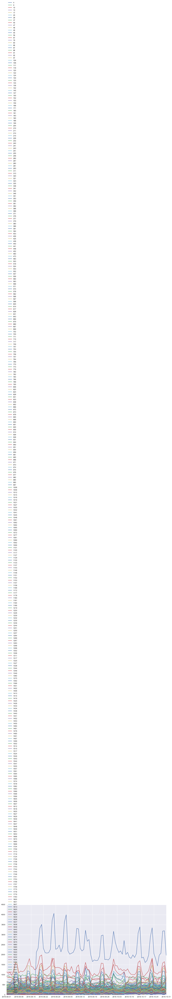

In [277]:
draw_ids(ids_trend_flat,start_date='2016-08-01',end_date='2016-10-31',by_week=True)

In [ ]:
## 长期趋势

## 有2015双十一数据的

717


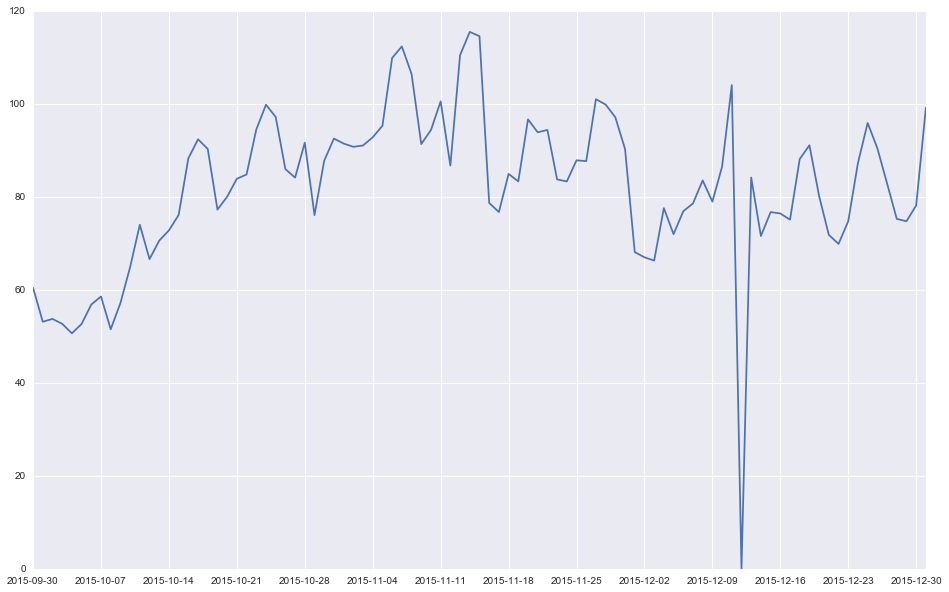

In [333]:
ids_2015_11_11 = []
def cal_2015_11_11(x):
    if pd.to_datetime(x['start_day']).date() < pd.to_datetime('2015-11-05').date():
        ids_2015_11_11.append(x['shop_id'])
    
shop_info.apply(lambda x: cal_2015_11_11(x),axis = 1)
print len(ids_2015_11_11)
draw_ids_avg(ids_2015_11_11,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

### 根据行业细分

In [357]:
shop_info['cate_3_name'].value_counts()

西式快餐        405
中式快餐        220
生鲜水果        111
奶茶           92
其它小吃         87
面包           71
饮品/甜点        67
面点           50
蛋糕           39
零食           22
其它地方菜        20
西餐           19
其它休闲食品       16
日韩料理         15
米粉/米线        15
其它快餐         14
江浙菜          13
川味/重庆火锅      13
川菜           13
其它烘焙糕点       12
粤菜           12
其它火锅         11
冰激凌          10
麻辣烫/串串香       9
中式烧烤          8
其他餐饮美食        7
咖啡            6
西北菜           6
熟食            4
砂锅/煲类/炖菜      4
东北菜           3
海鲜            3
自助餐           3
粥             3
台湾菜           2
湖北菜           2
咖啡厅           2
其它烧烤          1
湘菜            1
闽菜            1
香锅/烤鱼         1
上海本帮菜         1
美食特产          1
Name: cate_3_name, dtype: int64

In [312]:
shop_info.loc[ids_2015_11_11,'2015-11-01':'2015-12-01'].groupby(shop_info['cate_2_name'])

In [323]:
shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='快餐'

1       False
5       False
7        True
9       False
11      False
14       True
16      False
17       True
19      False
22      False
25       True
26       True
27       True
28       True
37       True
39      False
41       True
51       True
56       True
57       True
58      False
60      False
62       True
64      False
79       True
82      False
83       True
85       True
86      False
88       True
        ...  
1923    False
1924     True
1926    False
1928     True
1933    False
1934     True
1935    False
1936     True
1938    False
1940     True
1941    False
1942     True
1943    False
1945    False
1951     True
1955     True
1960    False
1965    False
1972     True
1975    False
1976    False
1977     True
1980    False
1985     True
1986     True
1987    False
1990     True
1994    False
1997     True
1998    False
Name: cate_2_name, dtype: bool

In [359]:
ids_2015_11_11_kuaican = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='快餐'].index.tolist()
ids_2015_11_11_xishikuaican = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_3_name']=='西式快餐'].index.tolist()
ids_2015_11_11_zhongshikuaican = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_3_name']=='中式快餐'].index.tolist()
ids_2015_11_11_chaoshi = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='超市'].index.tolist()
ids_2015_11_11_bianlidian = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='便利店'].index.tolist()
ids_2015_11_11_xiuxianchayin = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='休闲茶饮'].index.tolist()
ids_2015_11_11_xiaochi = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='小吃'].index.tolist()
ids_2015_11_11_xiuxianshipin = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='休闲食品'].index.tolist()
ids_2015_11_11_zhongcan = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='中餐'].index.tolist()
ids_2015_11_11_qitameishi = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='其他美食'].index.tolist()
ids_2015_11_11_huoguo = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='火锅'].index.tolist()
ids_2015_11_11_shaokao = shop_info.loc[ids_2015_11_11,:][shop_info.loc[ids_2015_11_11,:]['cate_2_name']=='烧烤'].index.tolist()


#### 快餐：
#### 西式快餐  stable  其中西式快餐在双十一有 1/6 的小幅增长 
#### 中式快餐 mess 双十一增长则并不明显，但11.12 出现了10%的衰减

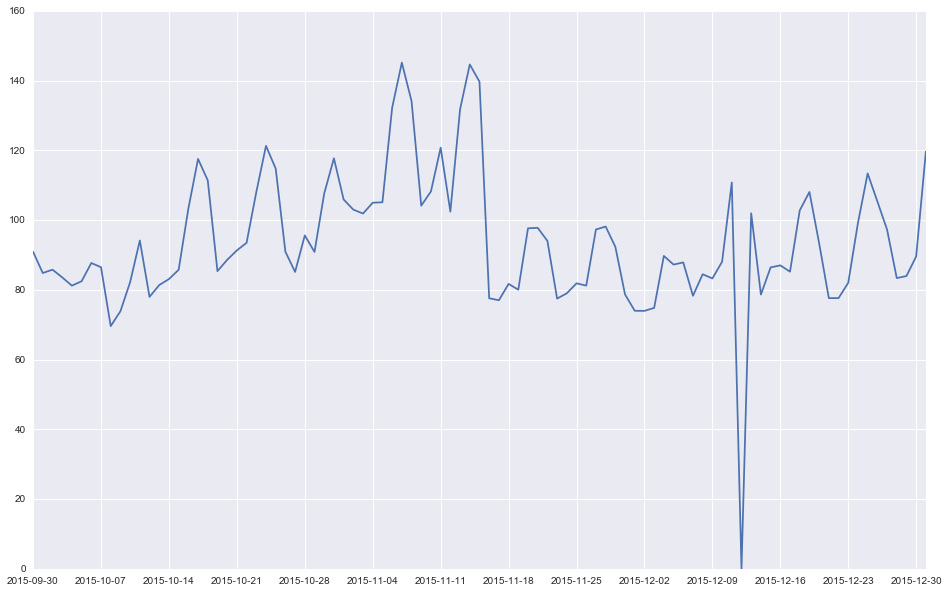

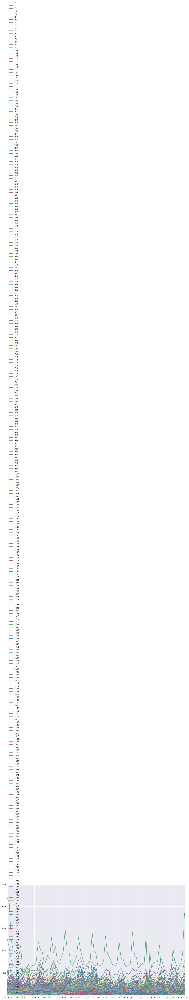

In [334]:
draw_ids_avg(ids_2015_11_11_kuaican,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_kuaican,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

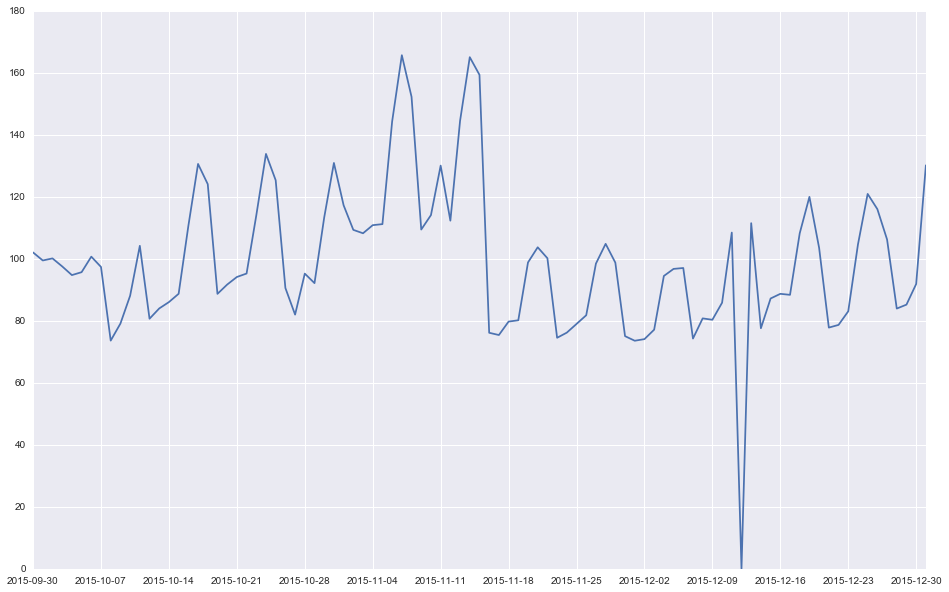

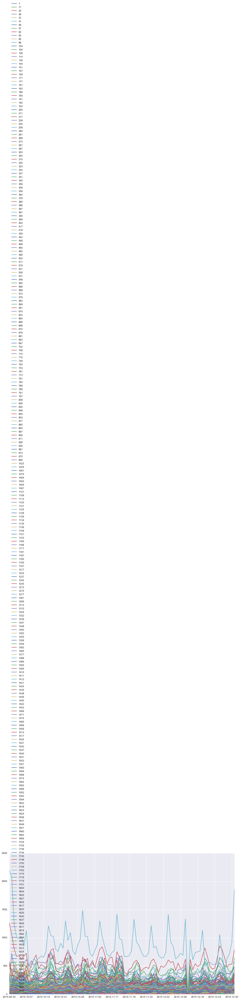

In [360]:
draw_ids_avg(ids_2015_11_11_xishikuaican,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_xishikuaican,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

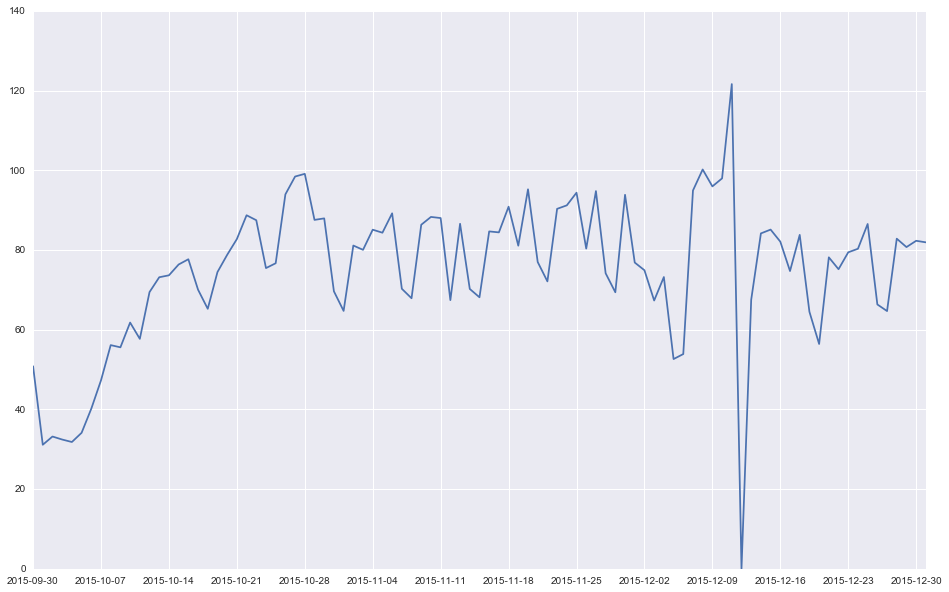

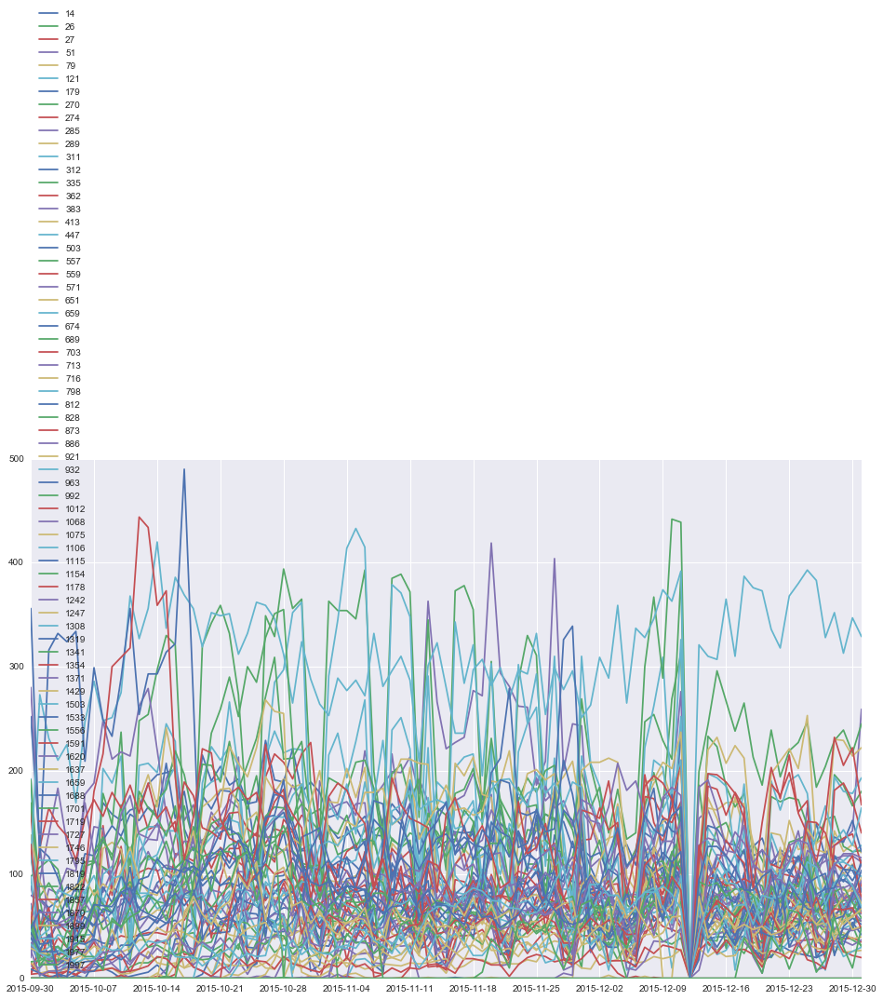

In [361]:
draw_ids_avg(ids_2015_11_11_zhongshikuaican,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_zhongshikuaican,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 超市 stable 11.11无增长 但 11.12有 1/5的衰减

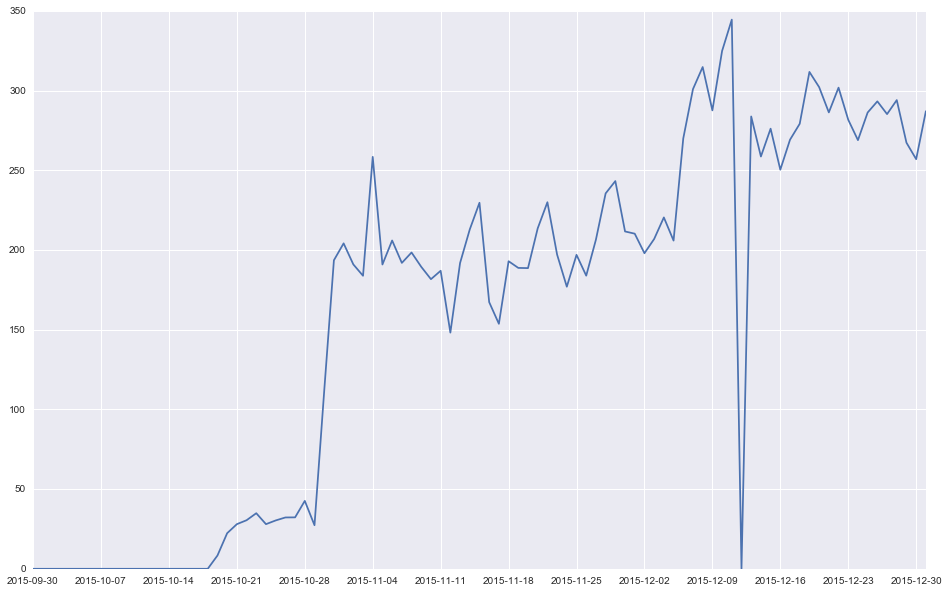

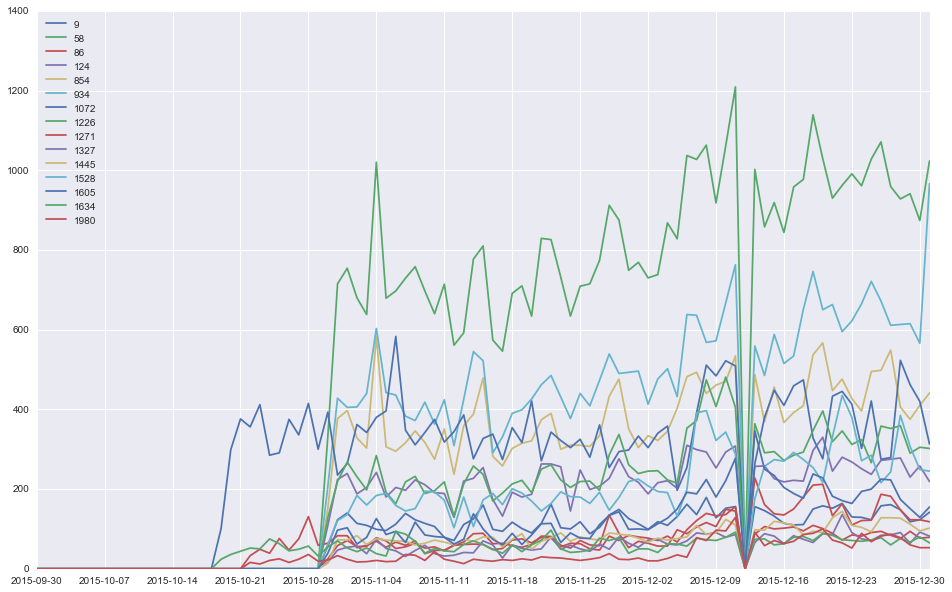

In [364]:
draw_ids_avg(ids_2015_11_11_chaoshi,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_chaoshi,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 便利店 stable 无变化，部分 11.12可能出现衰减

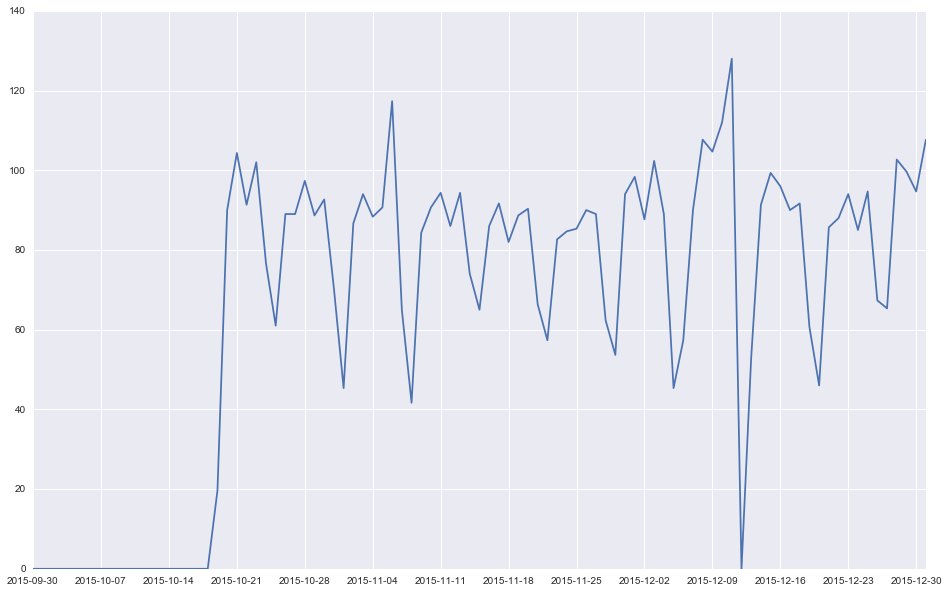

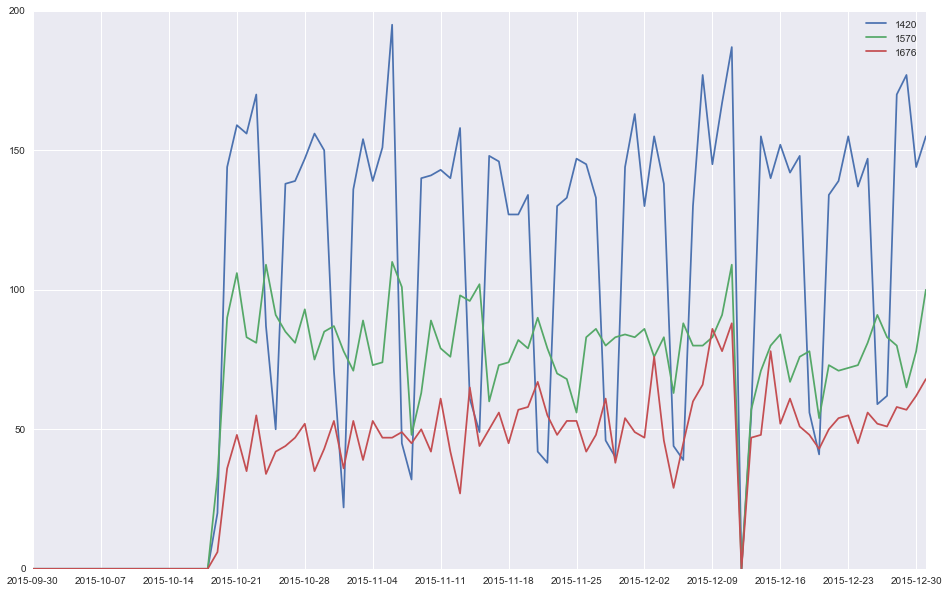

In [342]:
draw_ids_avg(ids_2015_11_11_bianlidian,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_bianlidian,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 休闲茶饮 mess  11.1～11.14 出现增长

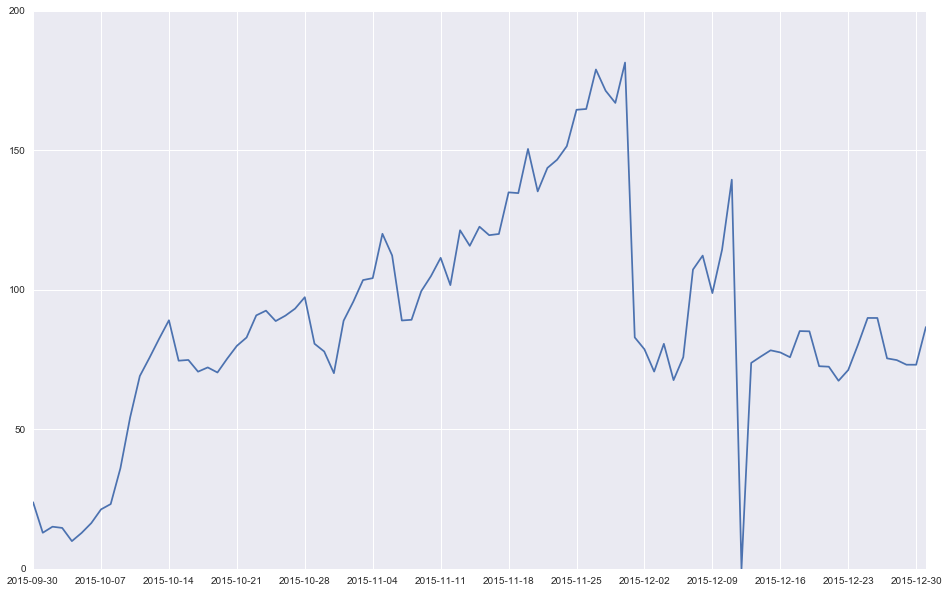

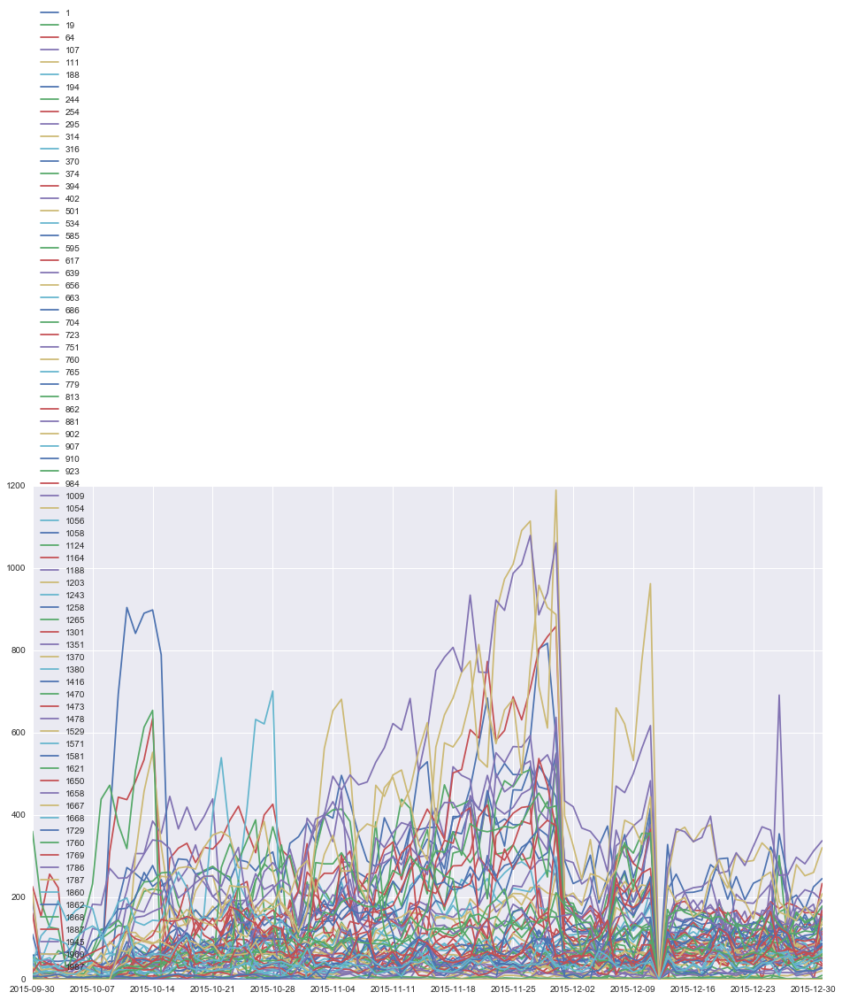

In [346]:
draw_ids_avg(ids_2015_11_11_xiuxianchayin,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_xiuxianchayin,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 小吃  mess 基本无变化  11.12 出现5%衰减

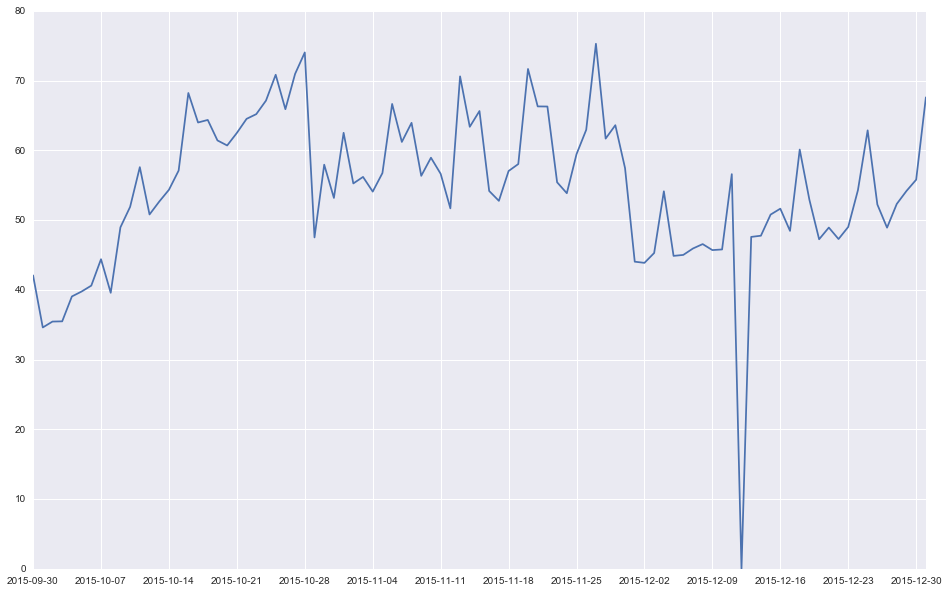

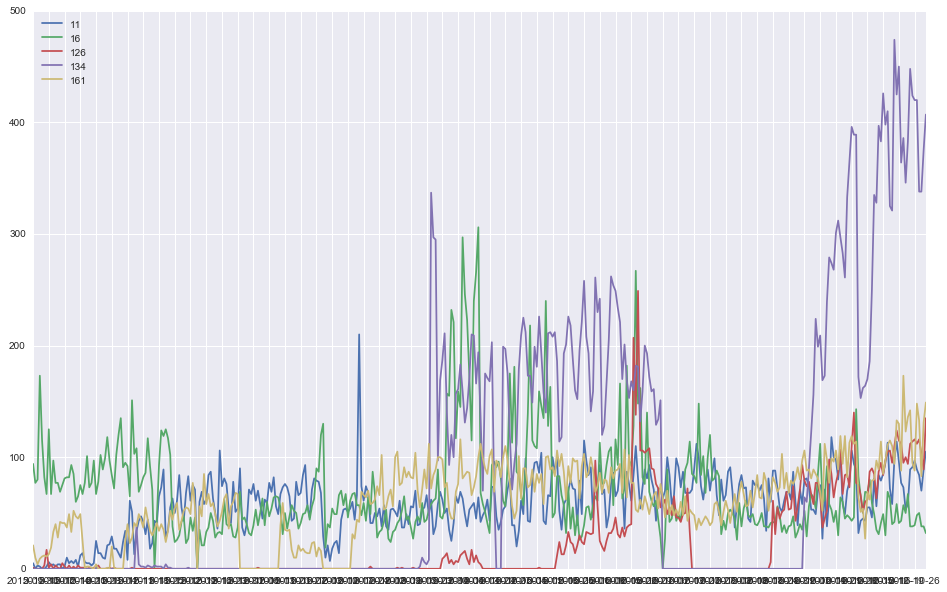

In [354]:
draw_ids_avg(ids_2015_11_11_xiaochi,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_xiaochi,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 休闲食品   过于mess 11.11 可能有提升 11.12 可能有衰减？？

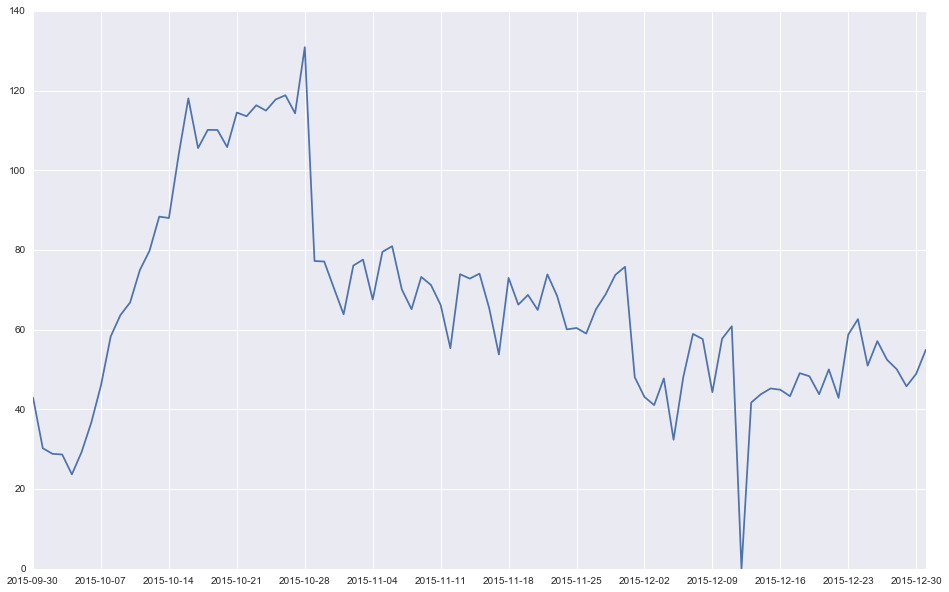

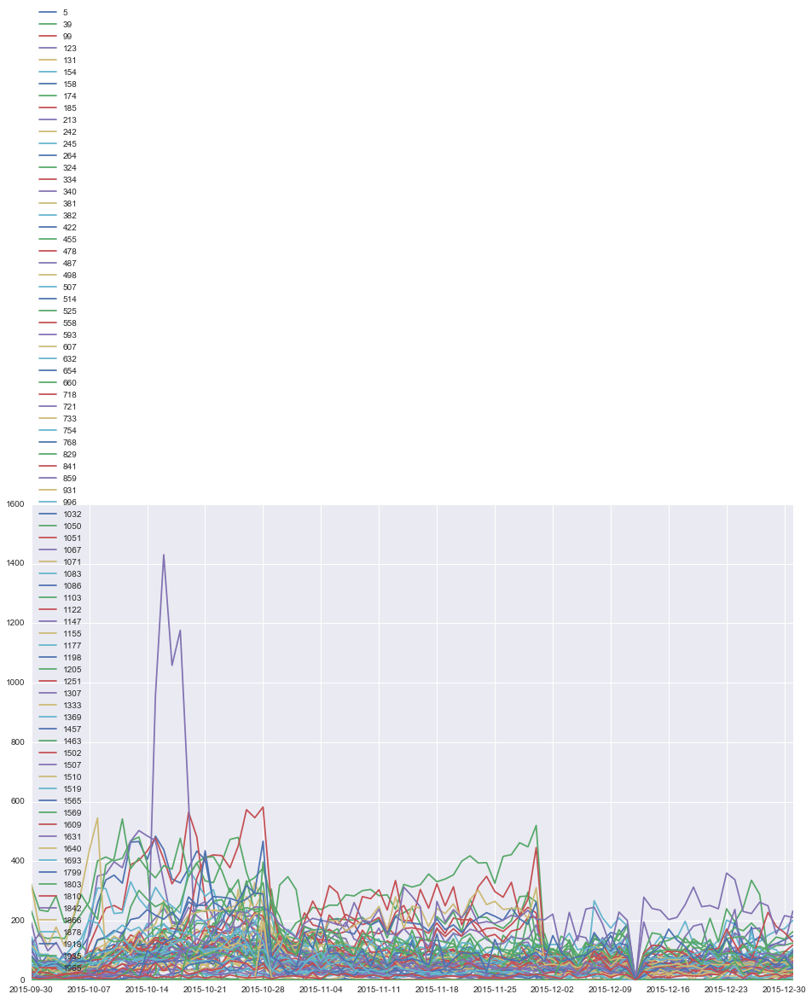

In [369]:
draw_ids_avg(ids_2015_11_11_xiuxianshipin,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_xiuxianshipin,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 烘焙糕点  mess 11.11 稳定  11.12 可能小幅衰减

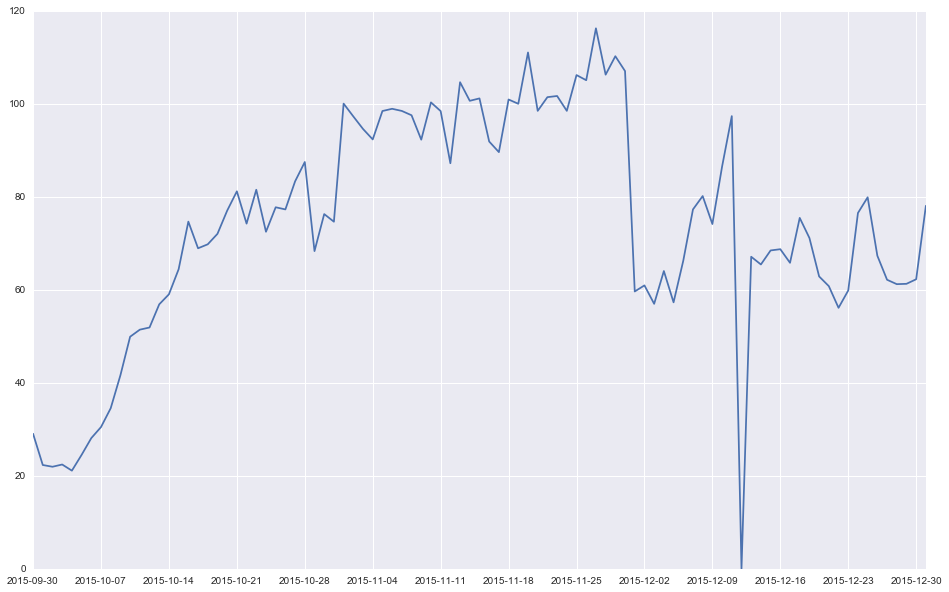

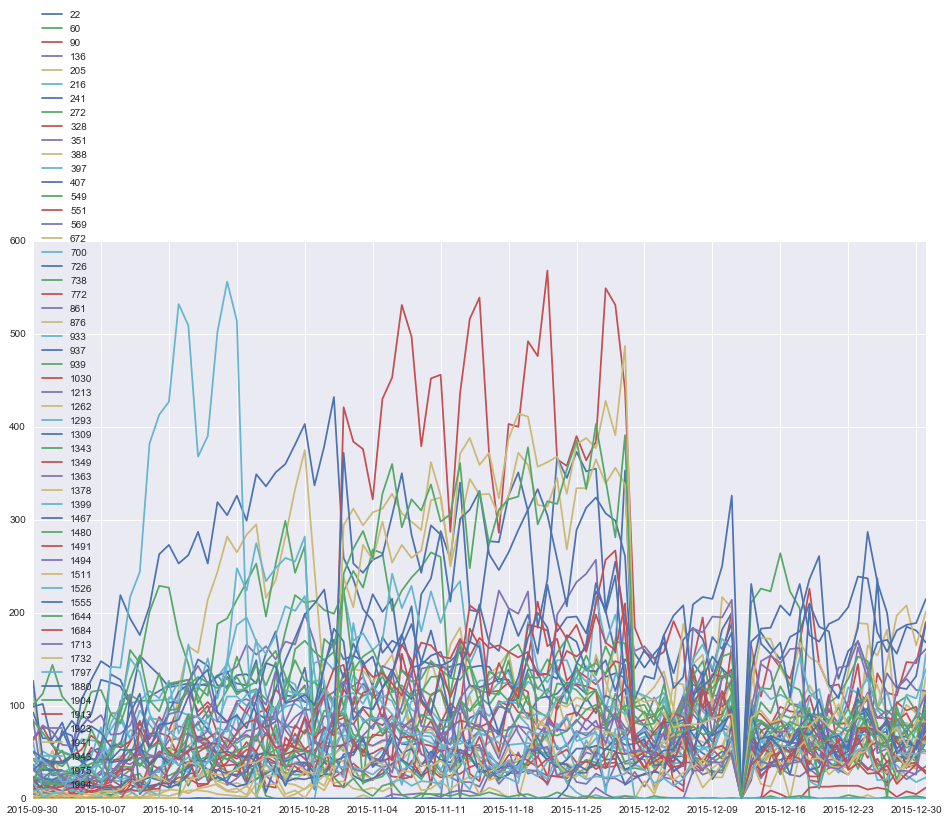

In [370]:
draw_ids_avg(ids_2015_11_11_hongbeigaodian,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_hongbeigaodian,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

#### 中餐 11.11 出现小衰减 11.12 稳定  11.1~11.14有增长趋势

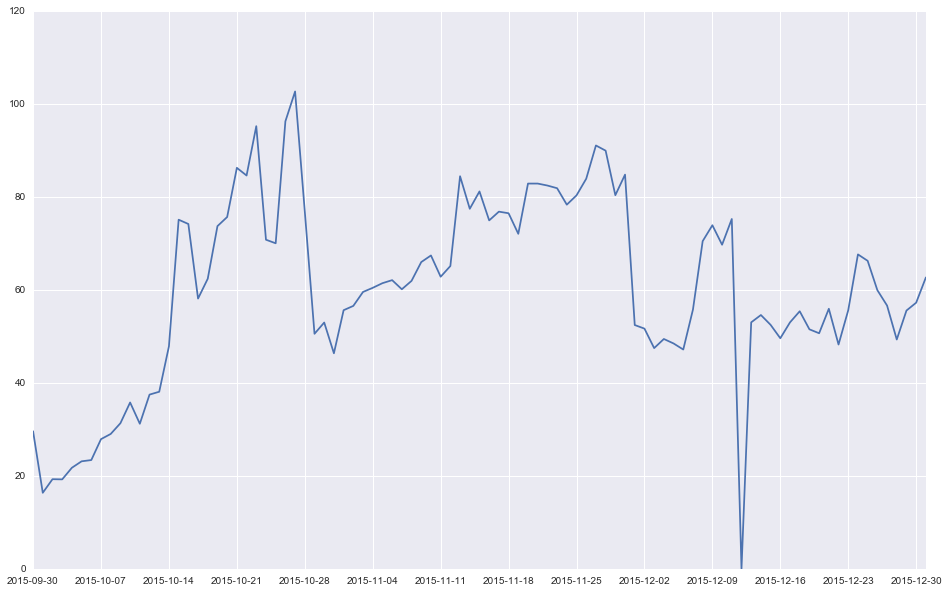

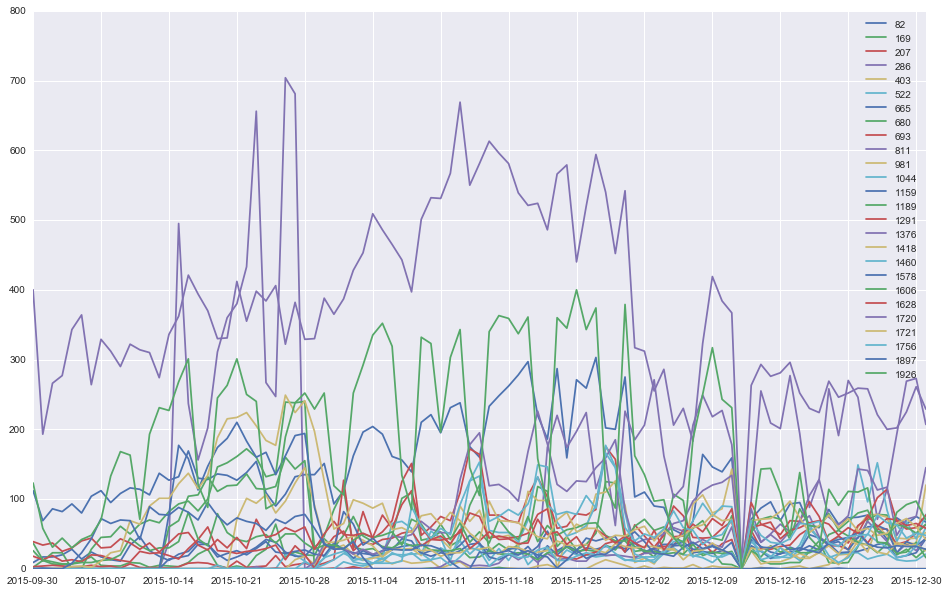

In [371]:
draw_ids_avg(ids_2015_11_11_zhongcan,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_zhongcan,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

In [ ]:
#### 其他美食  mess 部分在11.11有上升 11.7左右有异常

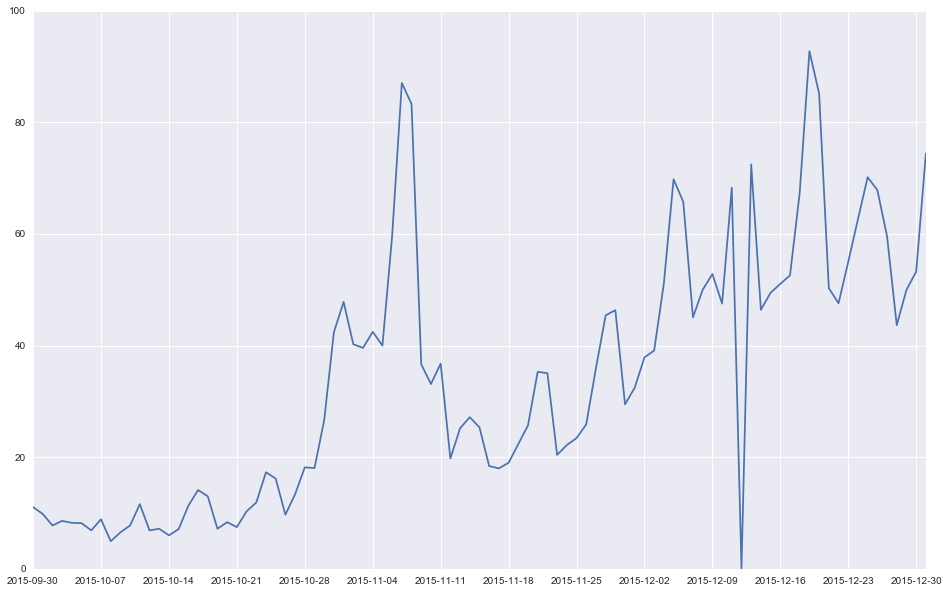

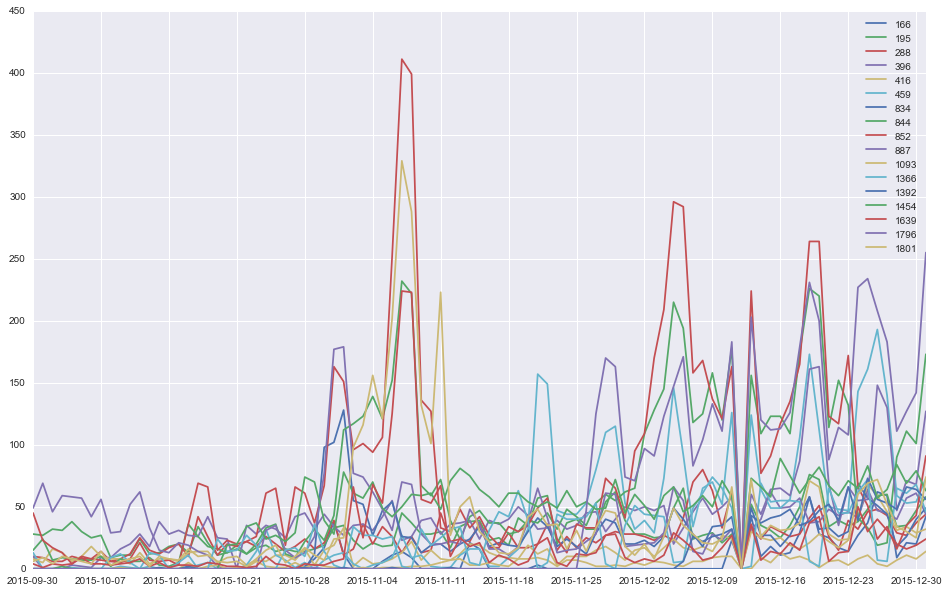

In [372]:
draw_ids_avg(ids_2015_11_11_qitameishi,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_qitameishi,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

In [ ]:
#### 火锅

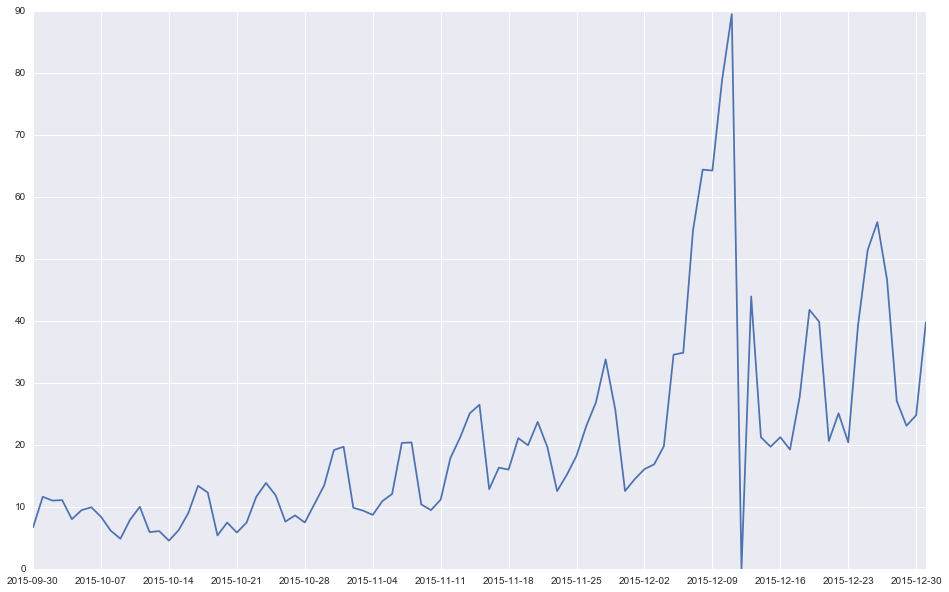

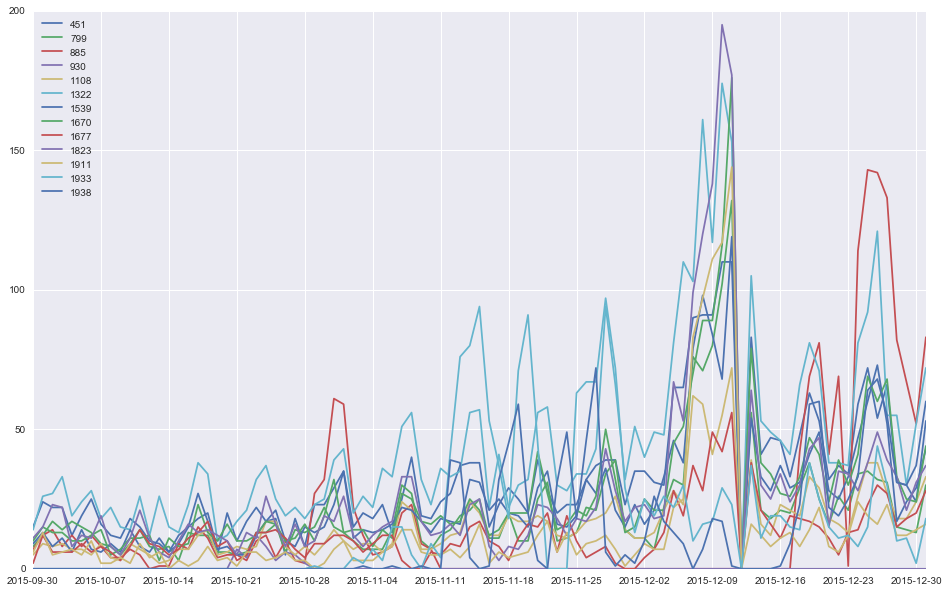

In [373]:
draw_ids_avg(ids_2015_11_11_huoguo,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))
draw_ids(ids_2015_11_11_huoguo,start_date='2015-09-30',end_date='2015-12-31',by_week=True,figsize=(16,10))

In [ ]:
#### 烧烤 

In [ ]:
休闲食品           150
烘焙糕点           122
中餐              78
其他美食            44
火锅              33
烧烤               9

In [ ]:
## 有2016七夕8.9数据的

## 营业后出现零值的

In [396]:
def cal_zero_count(x):
    return x[x['start_day']:'2016-10-31'][x[x['start_day']:'2016-10-31'] == 0].count()
    
shop_info['start_day']
shop_info['zero_count'] = shop_info.apply(lambda x: cal_zero_count(x),axis=1)

/Users/wakemeup/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: order is deprecated, use sort_values(...)
  if __name__ == '__main__':


1562


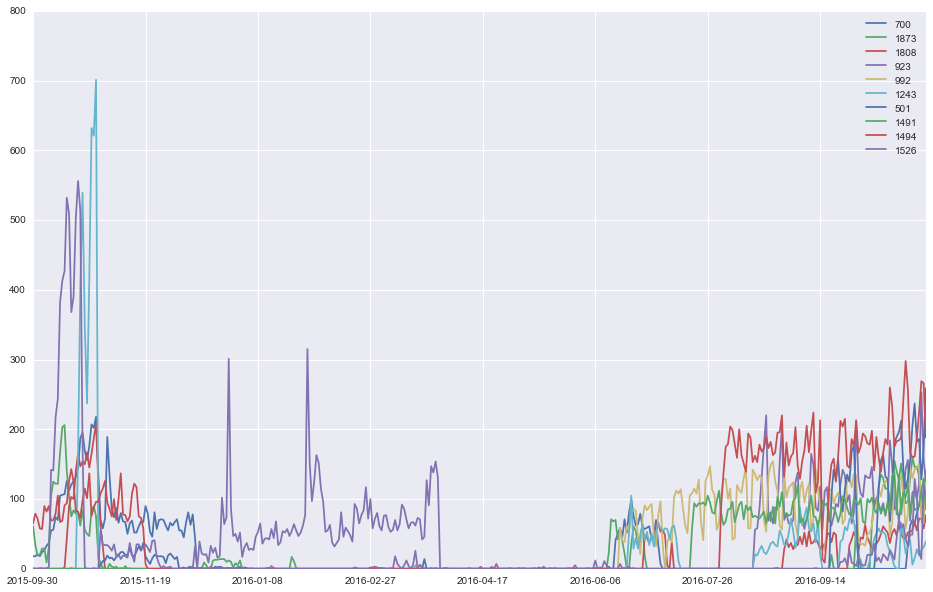

In [401]:
ids_zero_count_morethan0 =  shop_info['zero_count'][shop_info['zero_count']>0].order(ascending=False) # 按由高到低降序
ids_zero_count_morethan0 = ids_zero_count_morethan0.index.tolist()
print len(ids_zero_count_morethan0)
draw_ids(ids_zero_count_morethan0[:10],start_date='2015-09-30',end_date='2016-10-31',figsize=(16,10))

In [395]:
shop_info.loc[2,:][shop_info.loc[2,:]['start_day']:'2016-10-31'][shop_info.loc[2,:][shop_info.loc[2,:]['start_day']:'2016-10-31'] == 0].count()

13

In [ ]:
## 显示某个商家的同类商家看看是否有相似性

In [ ]:
## 寻找每个商家的稳定时间段

In [ ]:
# 实现相似 ID 查找算法